In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
    
import matplotlib.pyplot as plt
import cv2
import torch

from facemesh import FaceMesh
from pupil_detection import PupilDetectionModel
from utils import plot as plot_pupils
import numpy as np
import pandas as pd
from tqdm import tqdm

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
net = FaceMesh().to(device)
net.load_weights("./weights/facemesh.pth")

In [21]:
test_img_path = "/home/newuser/data/0_new_data/P_17/1491942071066_3_-study-dot_test/frame200.png"

In [22]:
img = cv2.imread(test_img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

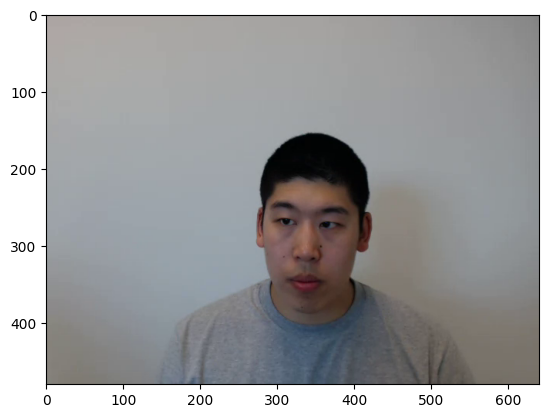

In [23]:
plt.imshow(img, zorder=1)

In [24]:
face_classifier = cv2.CascadeClassifier(
    cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
)

In [25]:
face = face_classifier.detectMultiScale(
    img, scaleFactor=1.1, minNeighbors=5, minSize=(40, 40)
)

In [26]:
face_crop = img[
    face[0][1] - face[0][3] // 3 : face[0][1] + face[0][3] + face[0][3] // 3,
    face[0][0] - face[0][2] // 3 : face[0][0] + face[0][2] + face[0][2] // 3, :
]

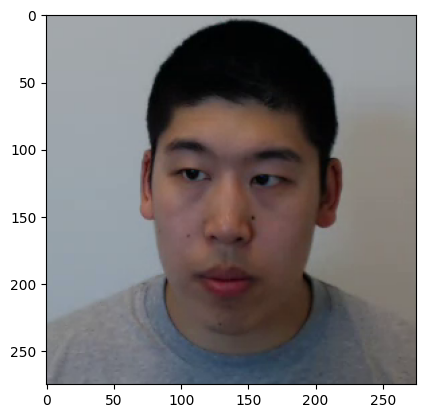

In [27]:
plt.imshow(face_crop, zorder=1)

In [28]:
face_crop = cv2.resize(face_crop, (192, 192), interpolation = cv2.INTER_LINEAR)

In [29]:
detections = net.predict_on_image(face_crop).numpy()
detections.shape

(468, 3)

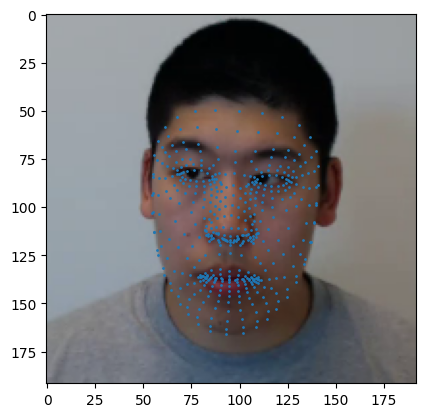

In [30]:
plt.imshow(face_crop, zorder=1)
x, y = detections[:, 0], detections[:, 1]
plt.scatter(x, y, zorder=2, s=1.0)
plt.show()

Get eye:
https://github.com/google/mediapipe/blob/master/mediapipe/python/solutions/face_mesh_connections.py

In [31]:
FACEMESH_RIGHT_EYE_list = [(33, 7), (7, 163), (163, 144), (144, 145),
                                (145, 153), (153, 154), (154, 155), (155, 133),
                                (33, 246), (246, 161), (161, 160), (160, 159),
                                (159, 158), (158, 157), (157, 173), (173, 133)]

left_eye_indices = []
for connection in list(FACEMESH_RIGHT_EYE_list):
    left_eye_indices.append(connection[0])
left_eye_indices.append(FACEMESH_RIGHT_EYE_list[-1][1])

In [37]:
FACEMESH_LEFT_EYE_list = [(263, 249), (249, 390), (390, 373), (373, 374),
                               (374, 380), (380, 381), (381, 382), (382, 362),
                               (263, 466), (466, 388), (388, 387), (387, 386),
                               (386, 385), (385, 384), (384, 398), (398, 362)]

right_eye_indices = []
for connection in list(FACEMESH_LEFT_EYE_list):
    right_eye_indices.append(connection[0])
right_eye_indices.append(FACEMESH_LEFT_EYE_list[-1][1])

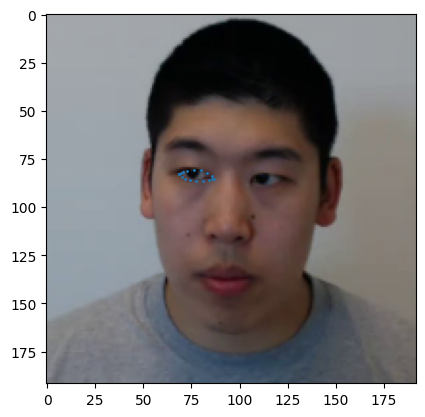

In [32]:
plt.imshow(face_crop, zorder=1)
x, y = detections[:, 0], detections[:, 1]
plt.scatter(x[left_eye_indices], y[left_eye_indices], zorder=2, s=1.0)
plt.show()

In [33]:
points = detections[left_eye_indices]

sorted_point_x = sorted(points, key = lambda x: x[0])
sorted_point_y = sorted(points, key = lambda x: x[1])

left_point = sorted_point_x[0]
right_point = sorted_point_x[-1]
up_point = sorted_point_y[0]
down_point = sorted_point_y[-1]

margin_x = (64 - (right_point[0] - left_point[0])) / 2
margin_y = (64 - (down_point[1] - up_point[1])) / 2

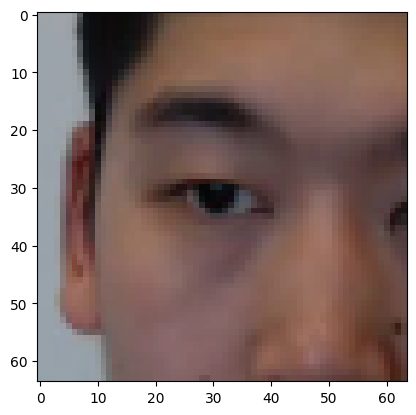

In [34]:
img_eye = face_crop[int(up_point[1] - margin_y) : int(down_point[1] + margin_y),
              int(left_point[0] - margin_x) : int(right_point[0] + margin_x), :]

plt.imshow(img_eye, zorder=1)

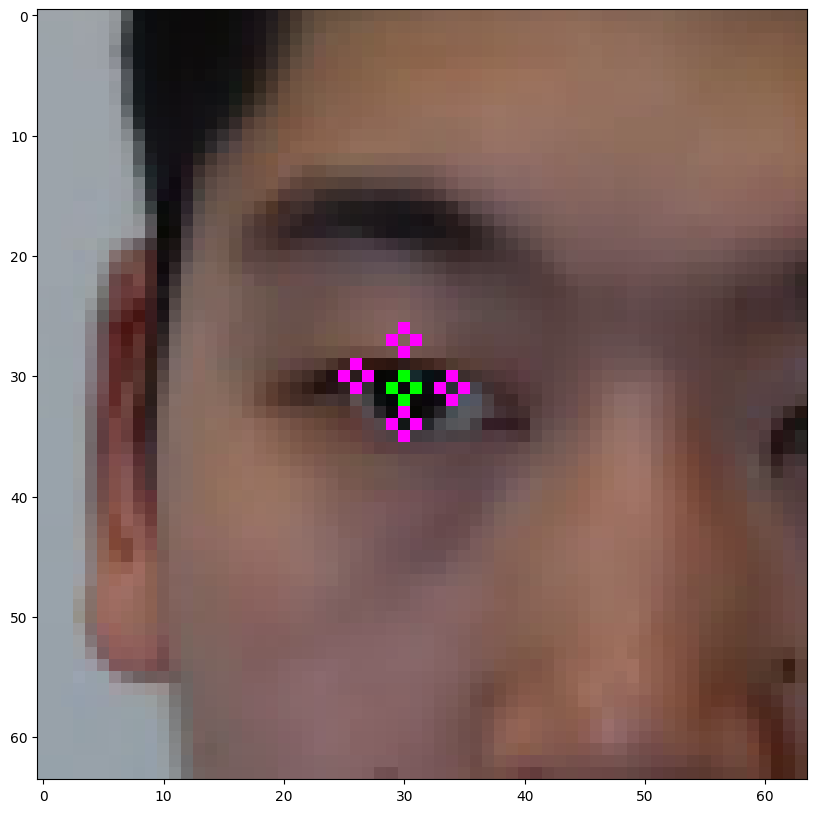

In [35]:
m = PupilDetectionModel(model_path = "./weights/irislandmarks.pth")
eye_contour, iris = m(cv2.cvtColor(img_eye, cv2.COLOR_RGB2BGR))
plot_pupils(img_eye, iris, eye_contour, plot_eye=False)

In [46]:
np.array([0,1,2,3]).reshape((2, -1))

array([[0, 1],
       [2, 3]])

In [33]:
class FeatureExtractor:
    def __init__(
        self,
        facemesh_weights: str = "./weights/facemesh.pth",
        pupil_detector_weights: str = "./weights/irislandmarks.pth",
        device: str = "cpu"
    ):
        self.face_detection_model = cv2.CascadeClassifier(
            cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
        )
        self.facemesh =  FaceMesh().to(device)
        self.facemesh.load_weights(facemesh_weights)
        self.pupil_detector = PupilDetectionModel(model_path = "./weights/irislandmarks.pth")
        self.left_eye_indices = [33, 7, 163, 144, 145, 153, 154, 155,
                                 246, 161, 160, 159, 158, 157, 173, 133]
        self.right_eye_indices = [249, 263, 362, 373, 374, 380, 381, 382,
                                  384, 385, 386, 387, 388, 390, 398, 466]

    def get_eye_crop(self, points: np.array, img: np.array, which_eye: str):
        h, w, _ = img.shape
        sorted_point_x = sorted(points, key = lambda x: x[0])
        sorted_point_y = sorted(points, key = lambda x: x[1])
        left_point = sorted_point_x[0]
        right_point = sorted_point_x[-1]
        up_point = sorted_point_y[0]
        down_point = sorted_point_y[-1]
        multiplicator = 1/2
        margin_x_left = max(64 - (right_point[0] - left_point[0]), 0) * multiplicator
        margin_x_right = max(64 - (right_point[0] - left_point[0]), 0) * (1 - multiplicator)
        margin_y = max(64 - (down_point[1] - up_point[1]), 0) / 2
        min_x, max_x = max(0, int(left_point[0] - margin_x_left)), min(w, int(right_point[0] + margin_x_right))
        min_y, max_y = max(0, int(up_point[1] - margin_y)), min(h, int(down_point[1] + margin_y))
        img_eye = img[min_y: max_y, min_x: max_x, :]
        left_top_point = (min_x, min_y) 
        return img_eye, left_top_point

    def get_pupil(self, points: np.array, img: np.array, which_eye: str, plot: bool = False):
        img_eye, left_top_point = self.get_eye_crop(points, img, which_eye = which_eye)
        eye_contour, iris = self.pupil_detector(cv2.cvtColor(img_eye, cv2.COLOR_RGB2BGR))
        if plot:
            plot_pupils(img_eye, iris, eye_contour, plot_eye=False)
        eye_contour, iris = eye_contour.reshape((-1, 3)), iris.reshape((-1, 3))
        eye_contour[:, 0] = eye_contour[:, 0] + left_top_point[0]
        eye_contour[:, 1] = eye_contour[:, 1] + left_top_point[1]
        iris[:, 0] = iris[:, 0] + left_top_point[0]
        iris[:, 1] = iris[:, 1] + left_top_point[1]
        return iris, eye_contour

    def extract_features(self, img_path: str, plot: bool = False):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if plot:
            plt.imshow(img)
            plt.show()
        face_rects = self.face_detection_model.detectMultiScale(
            img, scaleFactor=1.1, minNeighbors=5, minSize=(40, 40)
        )
        no_face_list = []
        if len(face_rects) > 0:
            if len(face_rects) > 1:
                face_rect = sorted(face_rects, key = lambda x: x[2] * x[3])[-1]
            else:
                face_rect = face_rects[0]
            face_crop = img[
                max(face_rect[1] - face_rect[3] // 3, 0) : min(face_rect[1] + face_rect[3] + face_rect[3] // 3, img.shape[1]),
                max(face_rect[0] - face_rect[2] // 3, 0) : min(face_rect[0] + face_rect[2] + face_rect[2] // 3, img.shape[1]), :
            ]
        else:
            no_face_list.append(img_path)
            face_crop = img.copy()
        face_crop = cv2.resize(face_crop, (192, 192), interpolation = cv2.INTER_LINEAR)
        facemesh_points = self.facemesh.predict_on_image(face_crop).numpy()
        left_eye_points = facemesh_points[self.left_eye_indices]
        right_eye_points = facemesh_points[self.right_eye_indices]
        left_pupil_points, left_eye_points = self.get_pupil(left_eye_points, face_crop, which_eye = "left", plot = plot)
        right_pupil_points, right_eye_points = self.get_pupil(right_eye_points, face_crop, which_eye = "right", plot = plot)
        if plot:
            plt.imshow(face_crop, zorder=1)
            x, y = facemesh_points[:, 0], facemesh_points[:, 1]
            plt.scatter(x, y, zorder=2, s=1.0)
            plt.scatter(left_pupil_points[:, 0], left_pupil_points[:, 1], zorder=2, s=1.0)
            plt.scatter(right_pupil_points[:, 0], right_pupil_points[:, 1], zorder=2, s=1.0)
            plt.show()
        return {
            "facemesh": facemesh_points.tolist(),
            "left_pupil": left_pupil_points.tolist(),
            "right_pupil": right_pupil_points.tolist()
        }, no_face_list, len(face_rects)

In [34]:
feature_extractor = FeatureExtractor()

In [35]:
test_img_path = "/home/newuser/data/0_new_data/P_08/1491591937547_3_-study-dot_test/frame76.png"

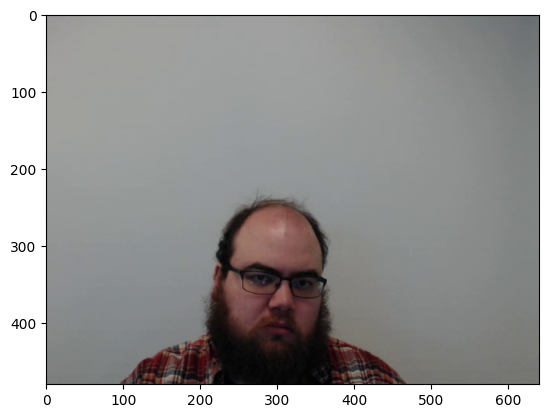

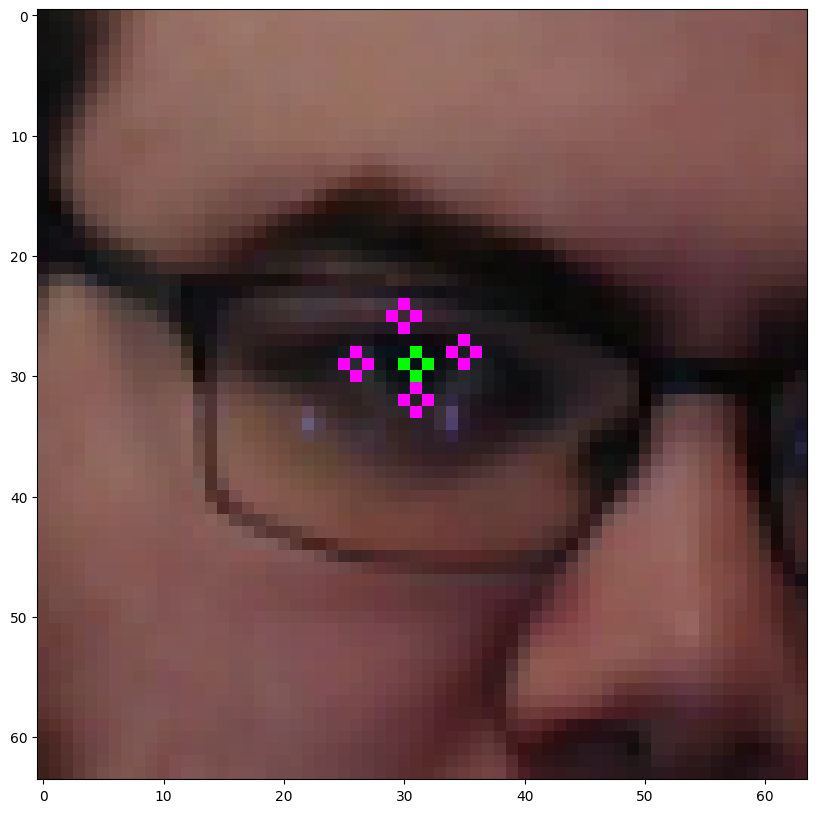

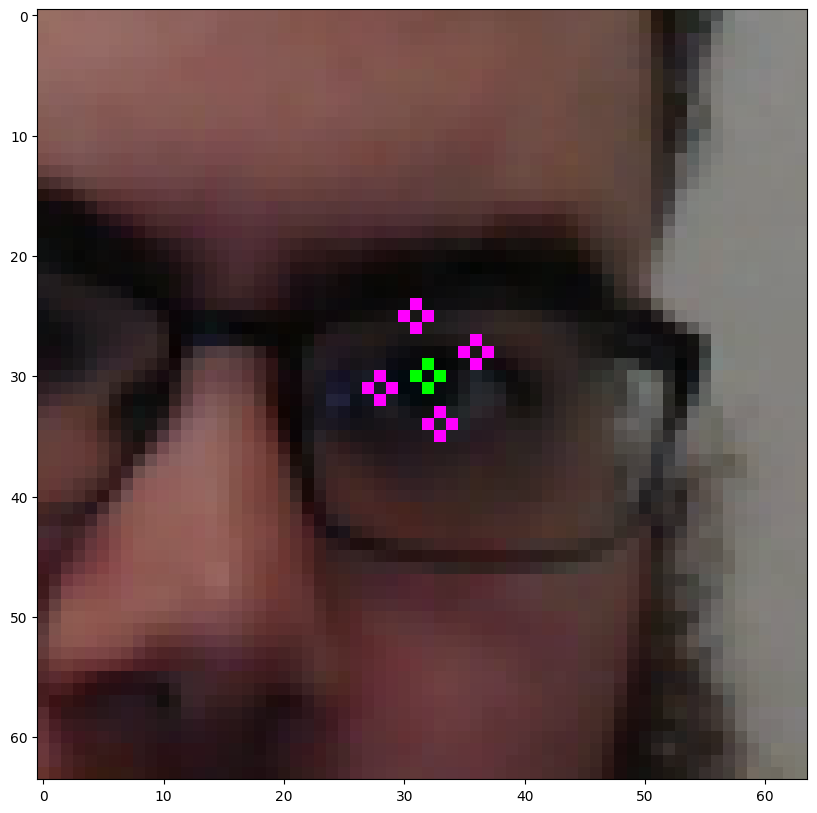

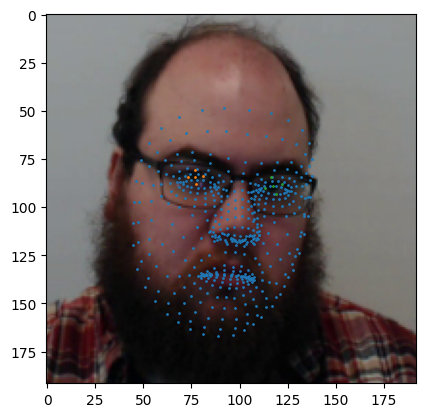

In [36]:
res_dict, _, _ = feature_extractor.extract_features(
    img_path = test_img_path,
    plot=True,
)

In [20]:
res_dict['right_pupil']

[[117.5982666015625, 89.0184097290039, -2.56309175491333],
 [121.9552001953125, 87.80325317382812, -2.6135787963867188],
 [116.4512710571289, 84.58906555175781, -2.619570732116699],
 [113.29608154296875, 90.10813903808594, -2.6562013626098633],
 [118.72451782226562, 93.37908935546875, -2.6339364051818848]]

In [37]:
coords = np.array(res_dict['right_pupil'])

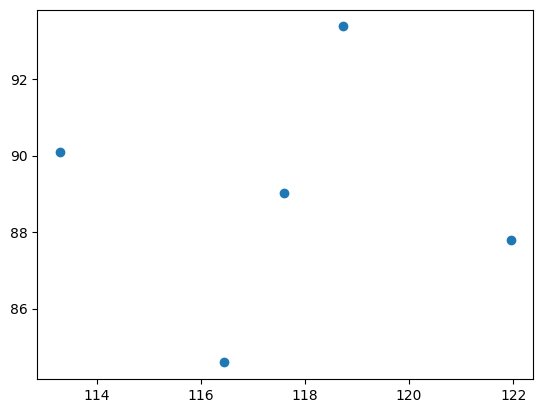

In [39]:
plt.scatter(coords[:, 0], coords[:, 1], zorder=2)

In [77]:
%%timeit
res_dict = feature_extractor.extract_features(
    img_path = test_img_path,
    plot=False,
)

52.2 ms ± 695 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [80]:
1 / (52.2 / 1000)

19.157088122605362

## Extract features

In [7]:
import concurrent.futures

In [8]:
clicks_df = pd.read_csv("../data/data_clicks.csv")

In [9]:
clicks_df.head()

,paths,x_normalized,y_normalized
0,/home/newuser/data/0_new_data/P_15/14919337389...,0.128472,0.437778
1,/home/newuser/data/0_new_data/P_15/14919337389...,0.027083,0.046667
2,/home/newuser/data/0_new_data/P_15/14919337389...,0.500694,0.044444
3,/home/newuser/data/0_new_data/P_15/14919337389...,0.972917,0.044444
4,/home/newuser/data/0_new_data/P_15/14919337389...,0.028472,0.378889


In [10]:
image_paths = clicks_df["paths"].values

  0%|                                                                                                                                | 0/1227 [00:00<?, ?it/s]

/home/newuser/data/0_new_data/P_57/1493143714690_24_-study-where_to_find_morel_mushrooms_writing/frame3914.png


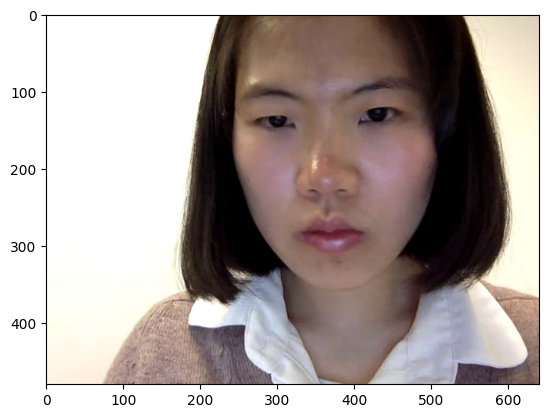

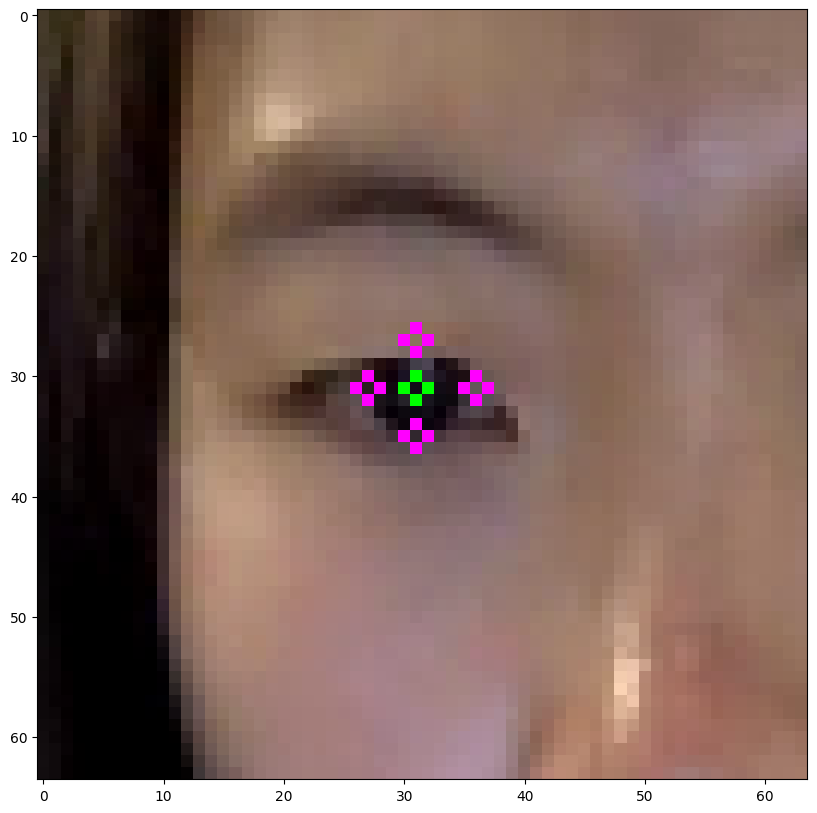

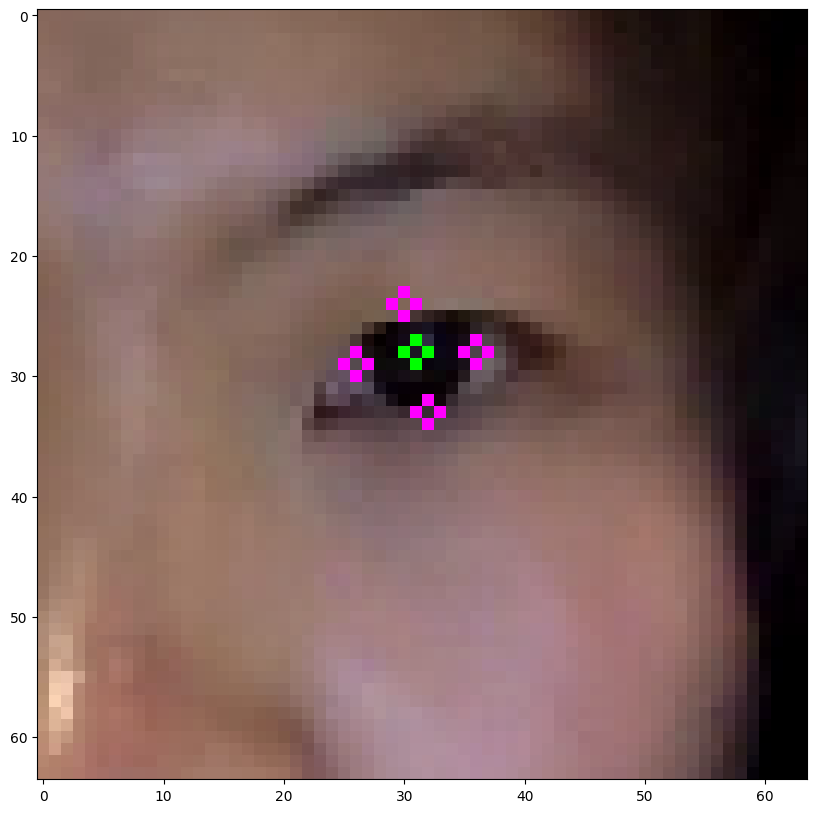

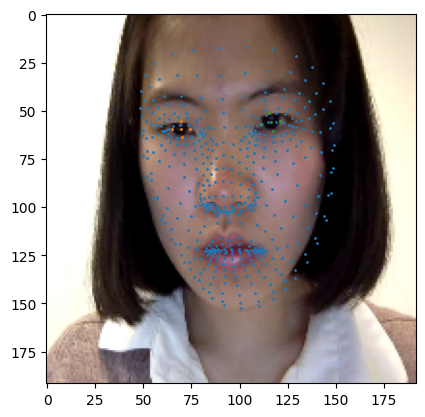

  0%|                                                                                                                        | 1/1227 [00:00<16:45,  1.22it/s]

/home/newuser/data/0_new_data/P_20/1492020948838_32_-study-tooth_abscess_writing/frame59.png


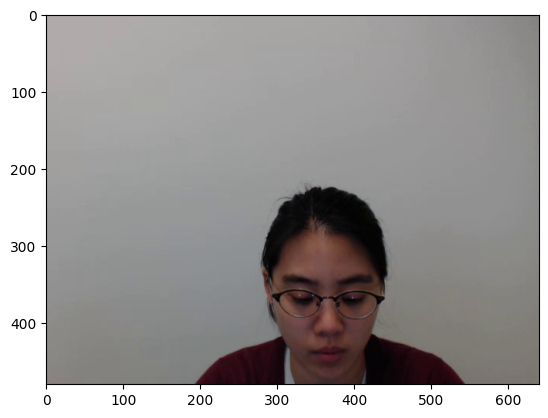

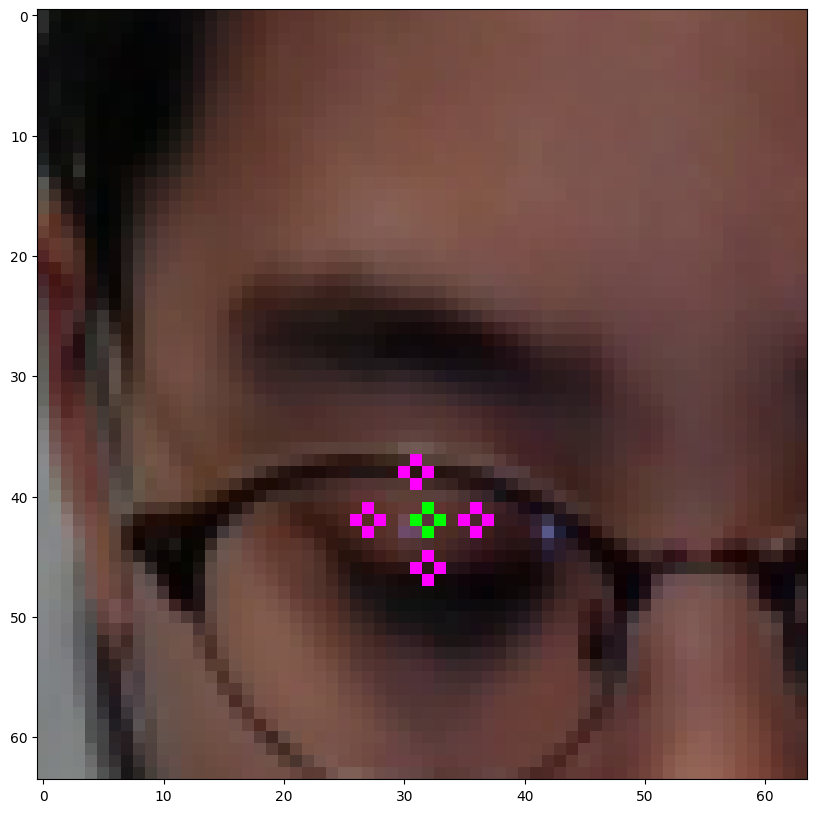

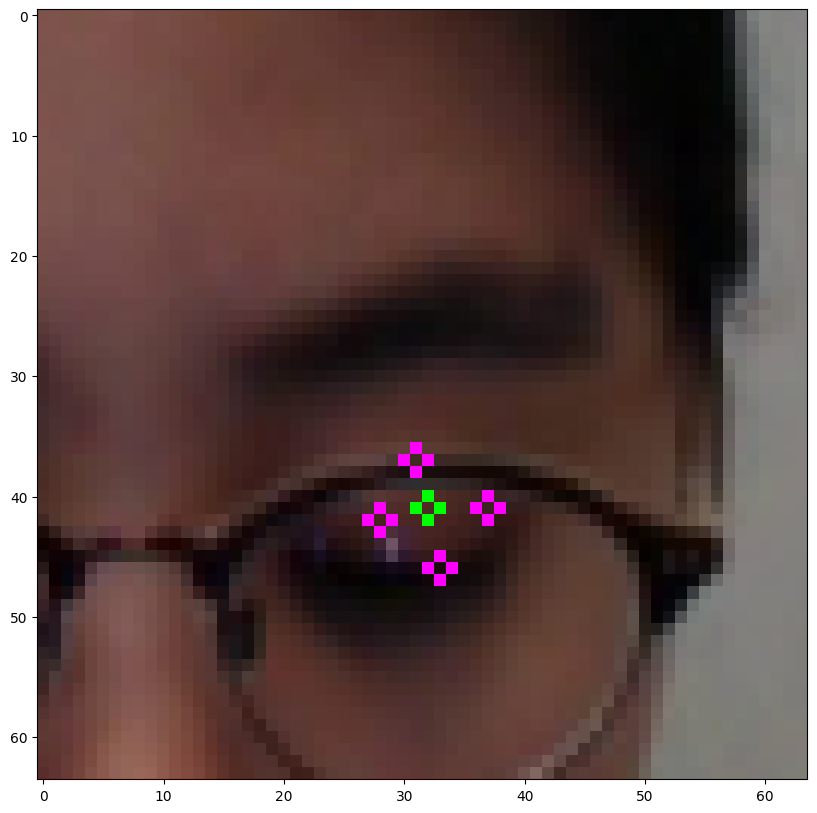

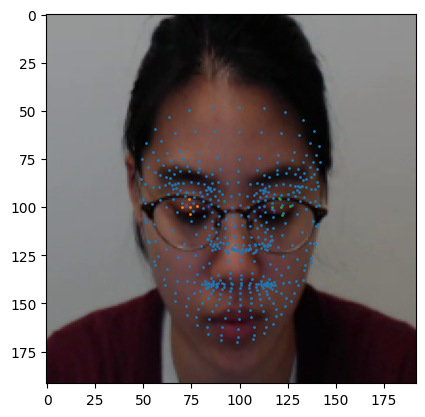

  0%|▏                                                                                                                       | 2/1227 [00:01<16:01,  1.27it/s]

/home/newuser/data/0_new_data/P_64/1493237348836_17_-study-educational_advantages_of_social_networking_sites_writing/frame3189.png


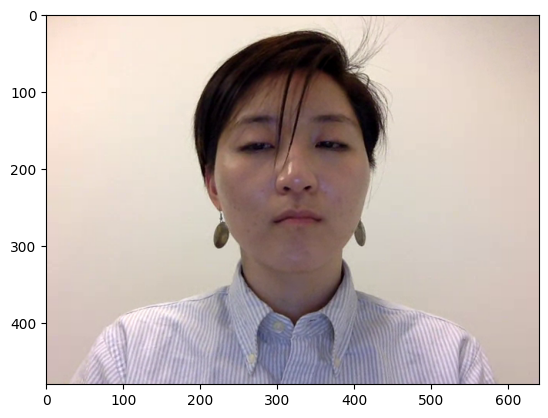

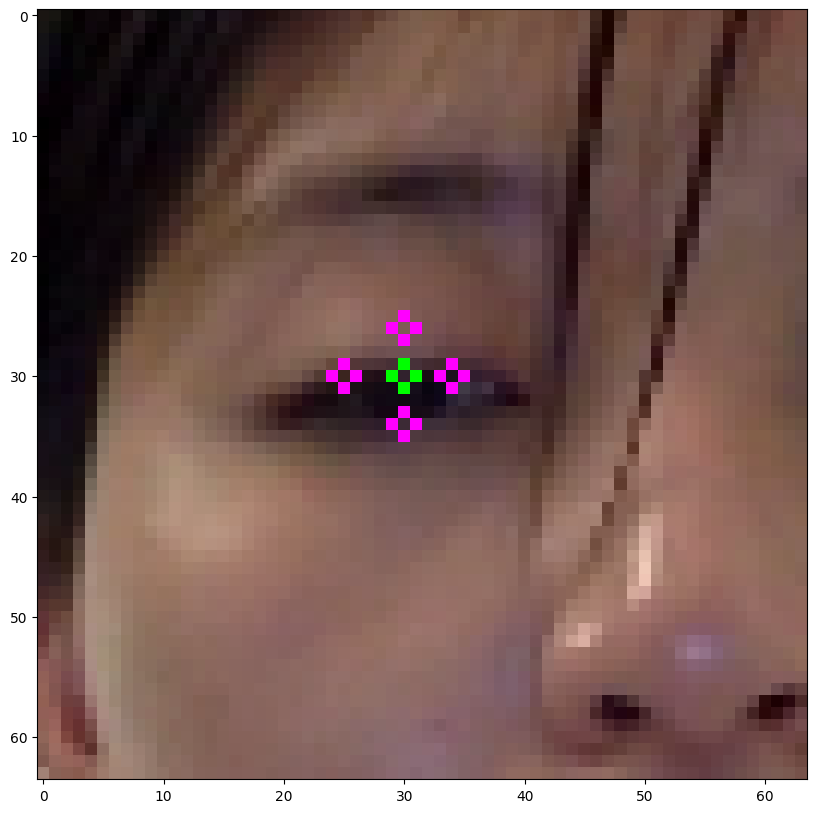

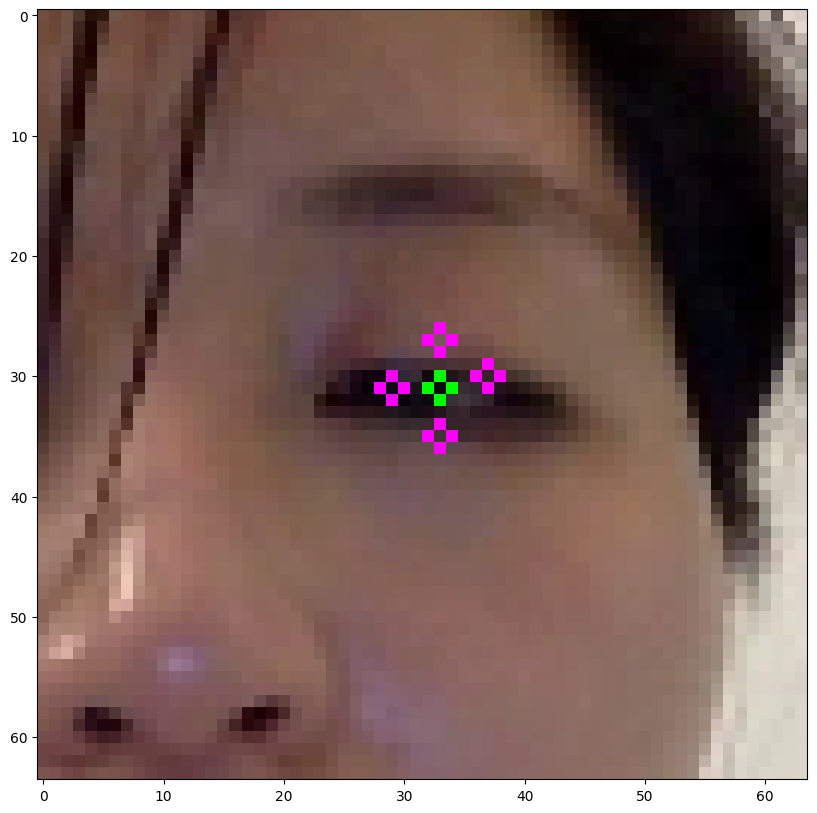

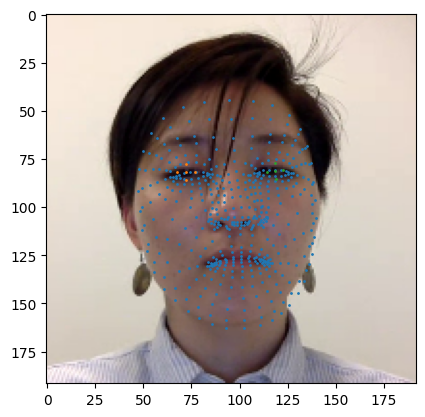

  0%|▎                                                                                                                       | 3/1227 [00:02<16:05,  1.27it/s]

/home/newuser/data/0_new_data/P_07/1491577862552_10_-study-benefits_of_running_writing/frame2230.png


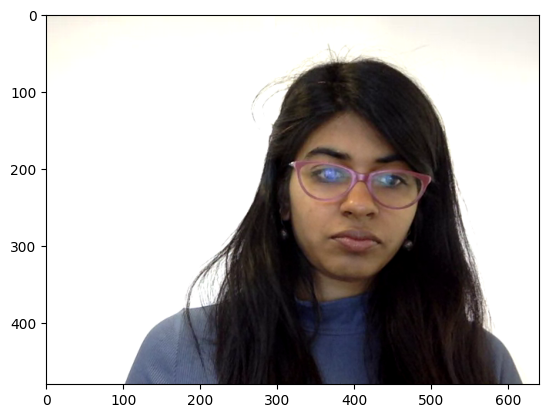

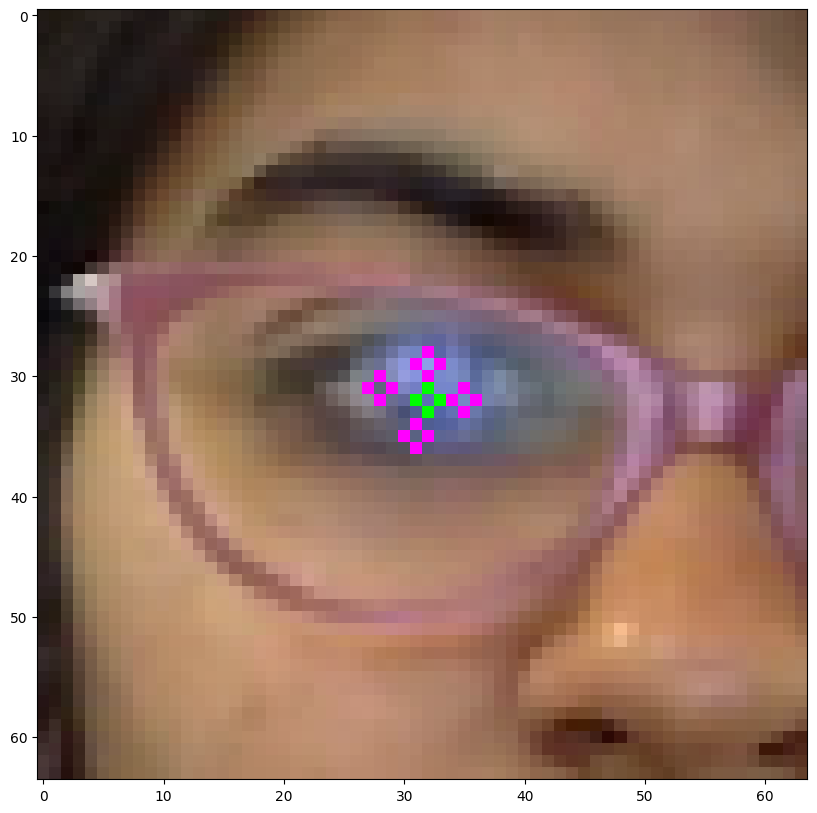

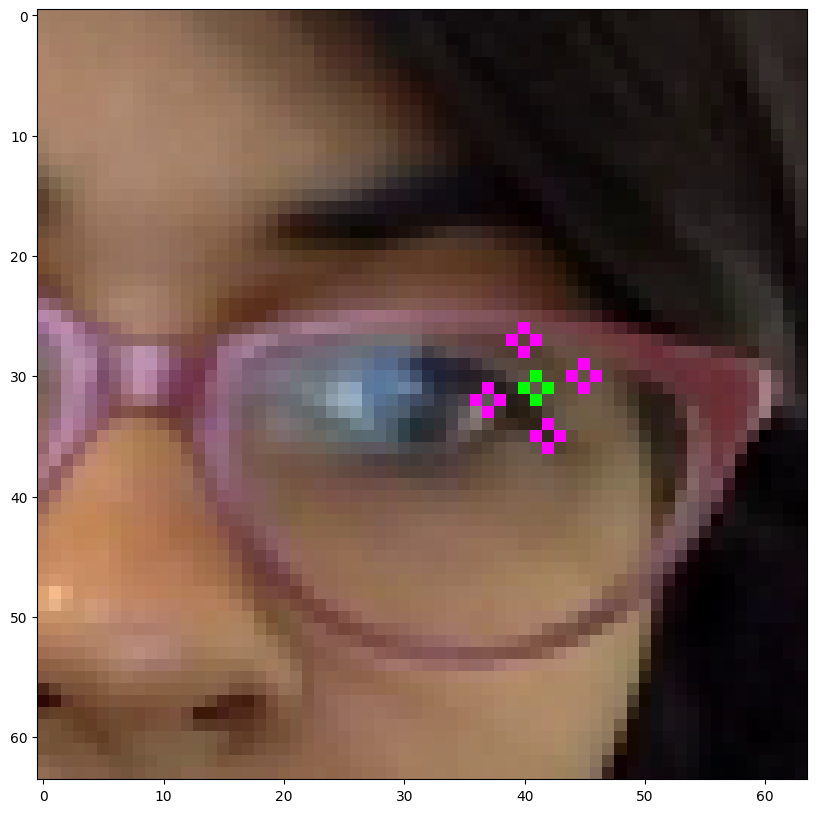

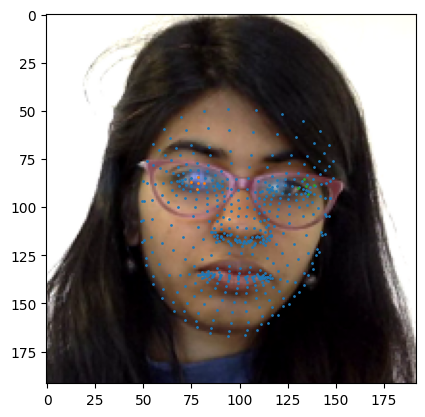

  0%|▍                                                                                                                       | 4/1227 [00:03<17:00,  1.20it/s]

/home/newuser/data/0_new_data/P_63/1493233434542_23_-study-tooth_abscess_writing/frame5765.png


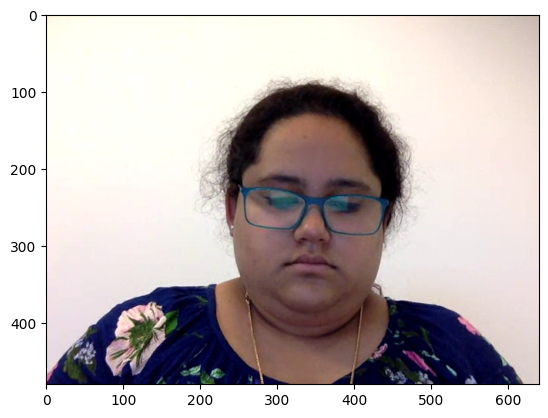

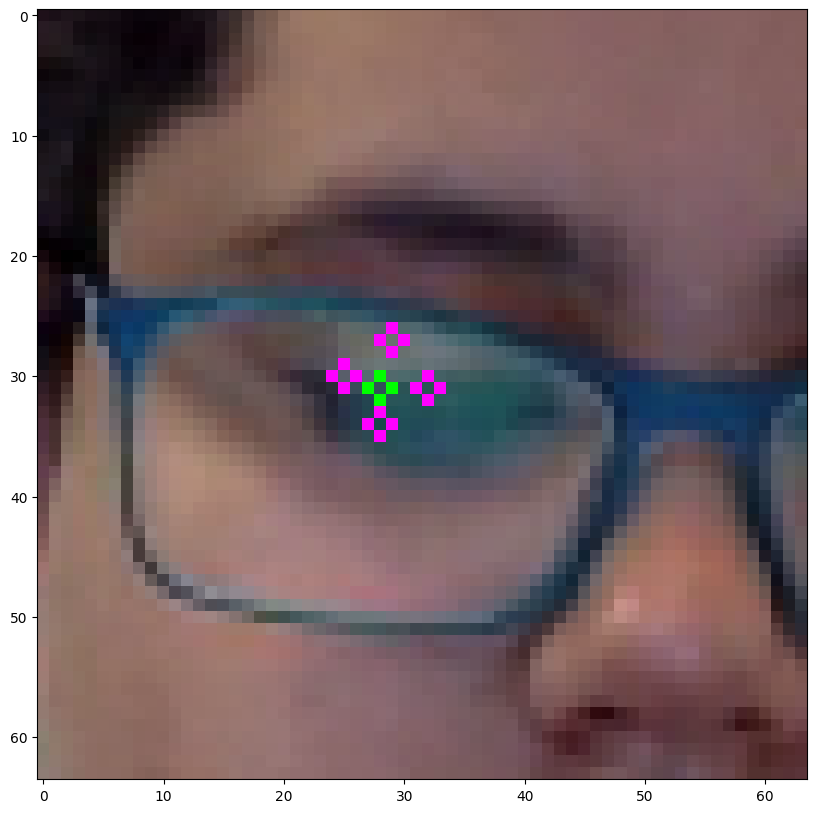

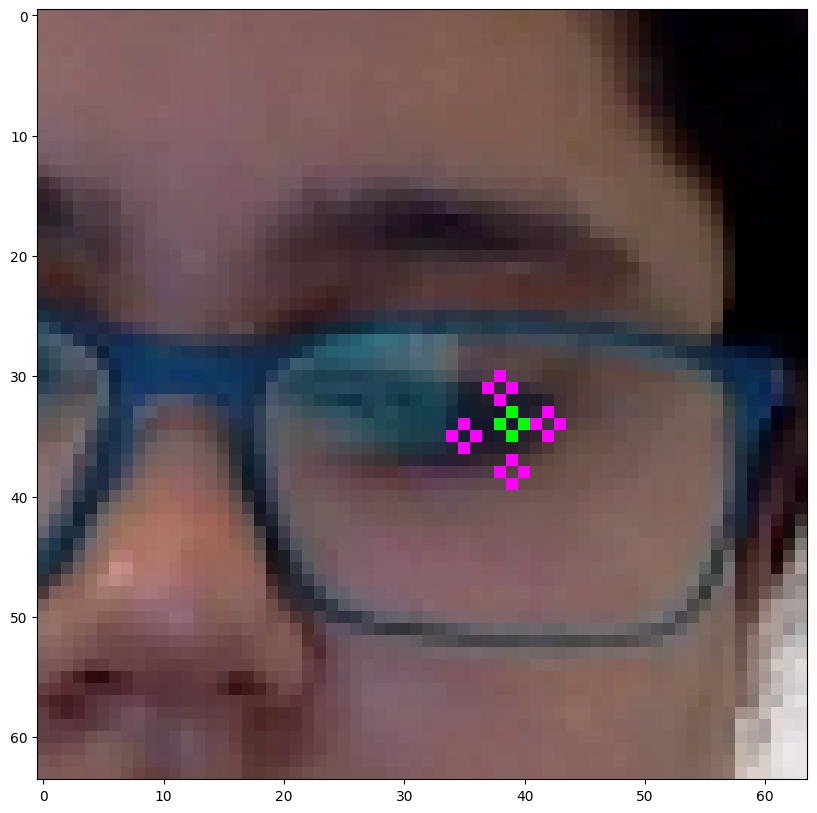

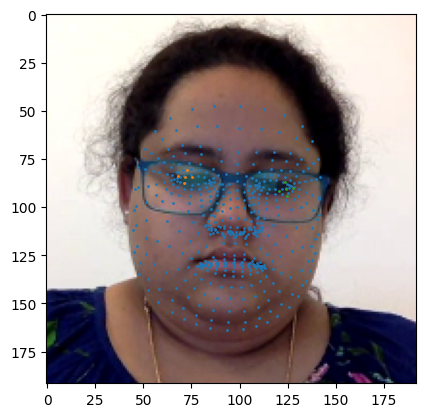

  0%|▍                                                                                                                       | 5/1227 [00:04<16:49,  1.21it/s]

/home/newuser/data/0_new_data/P_29/1492189262993_32_-study-tooth_abscess_writing/frame519.png


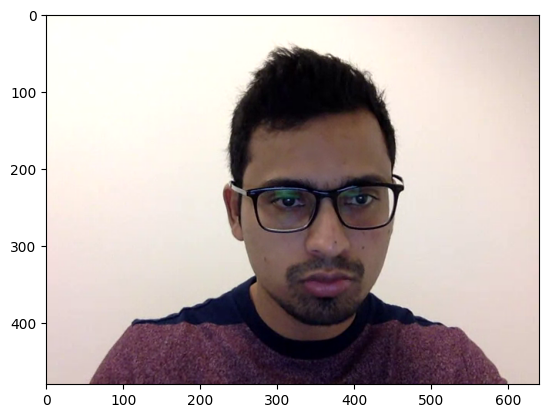

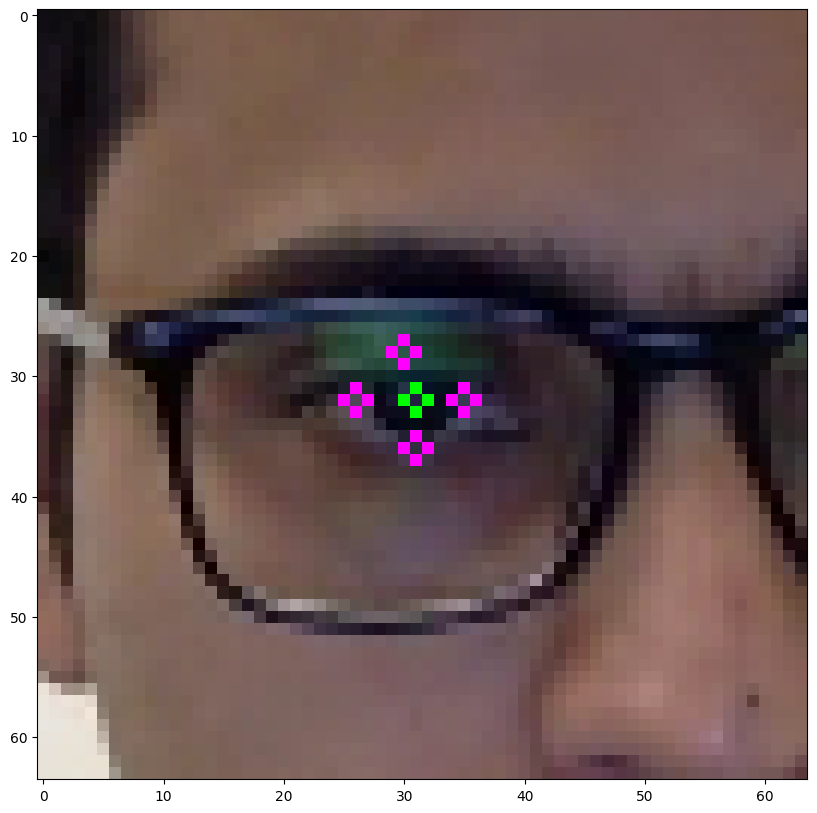

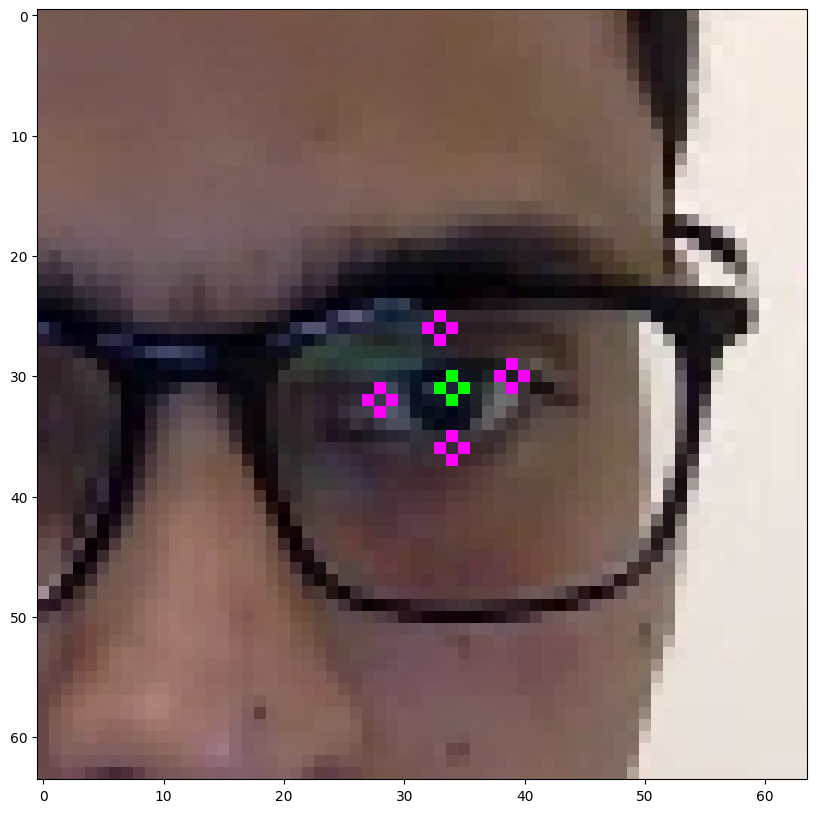

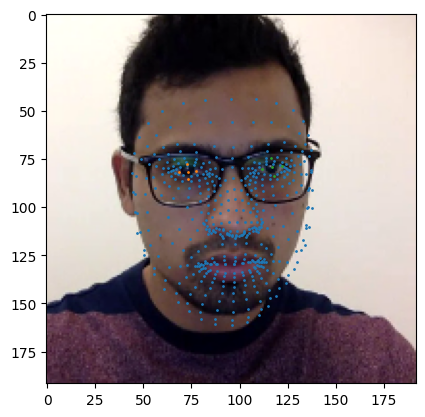

  0%|▌                                                                                                                       | 6/1227 [00:04<16:36,  1.23it/s]

/home/newuser/data/0_new_data/P_33/1492456607850_3_-study-dot_test/frame225.png


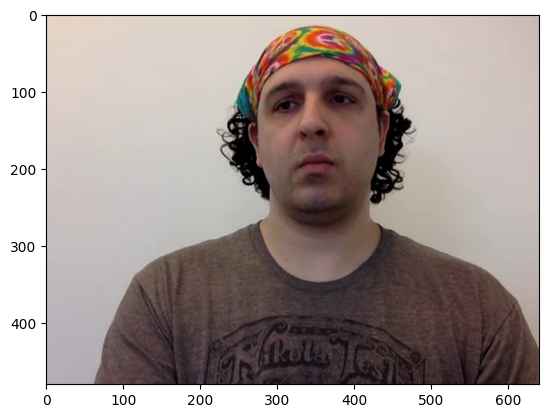

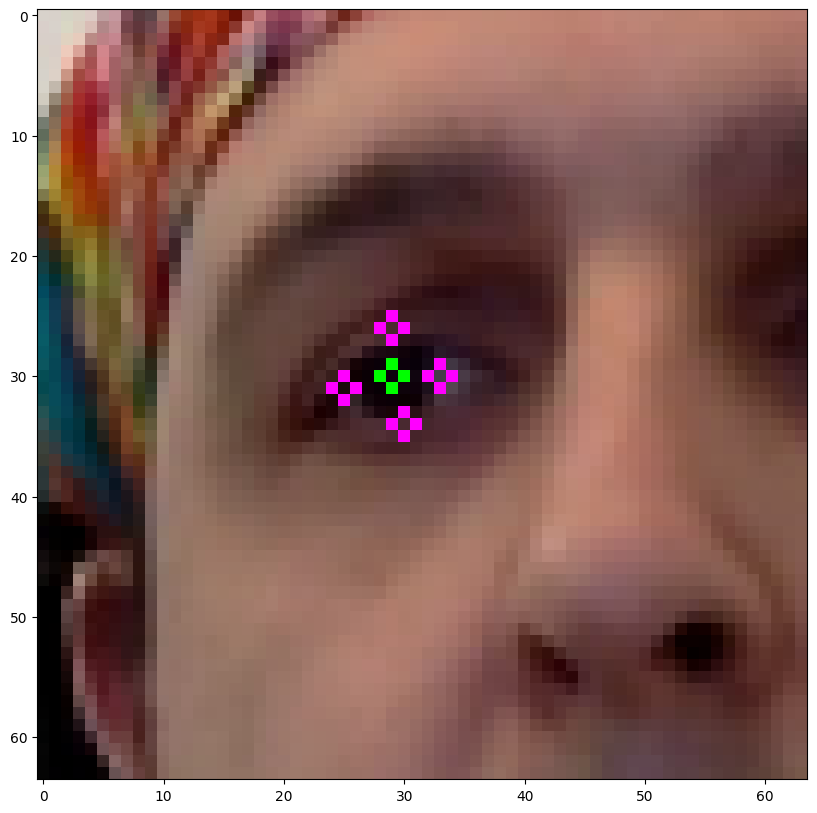

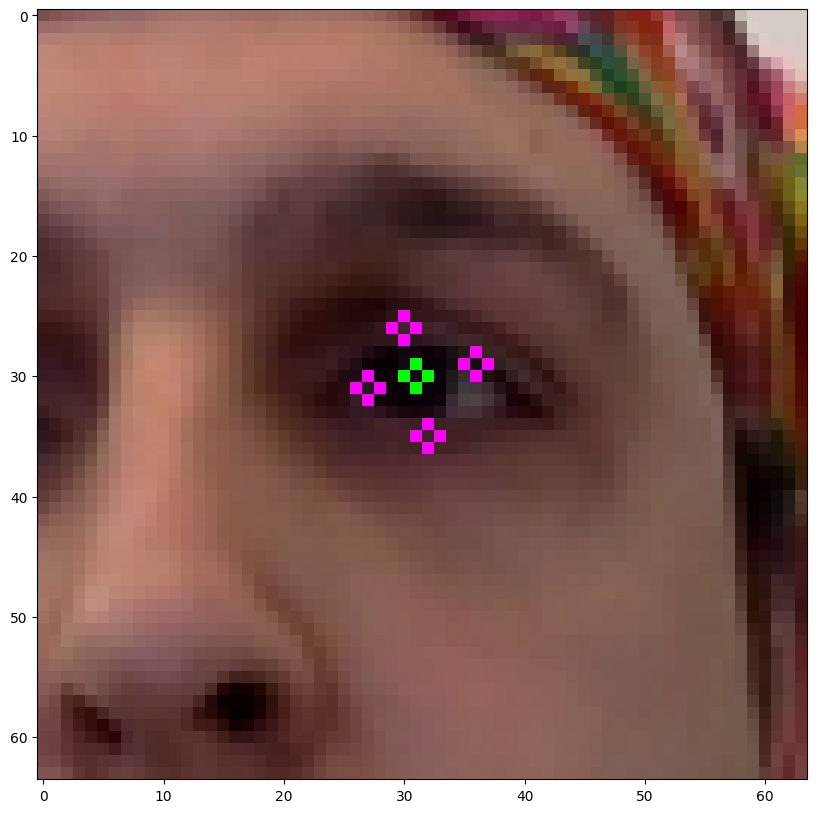

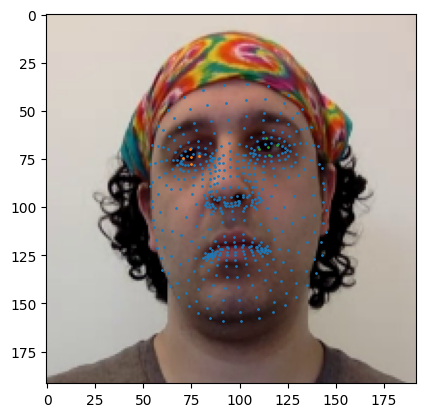

  1%|▋                                                                                                                       | 7/1227 [00:05<16:20,  1.24it/s]

/home/newuser/data/0_new_data/P_35/1492538568613_3_-study-dot_test/frame450.png


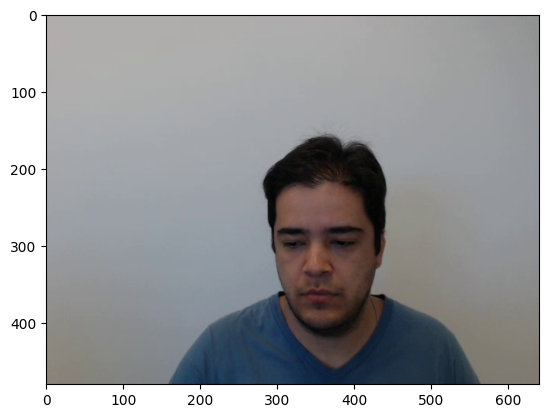

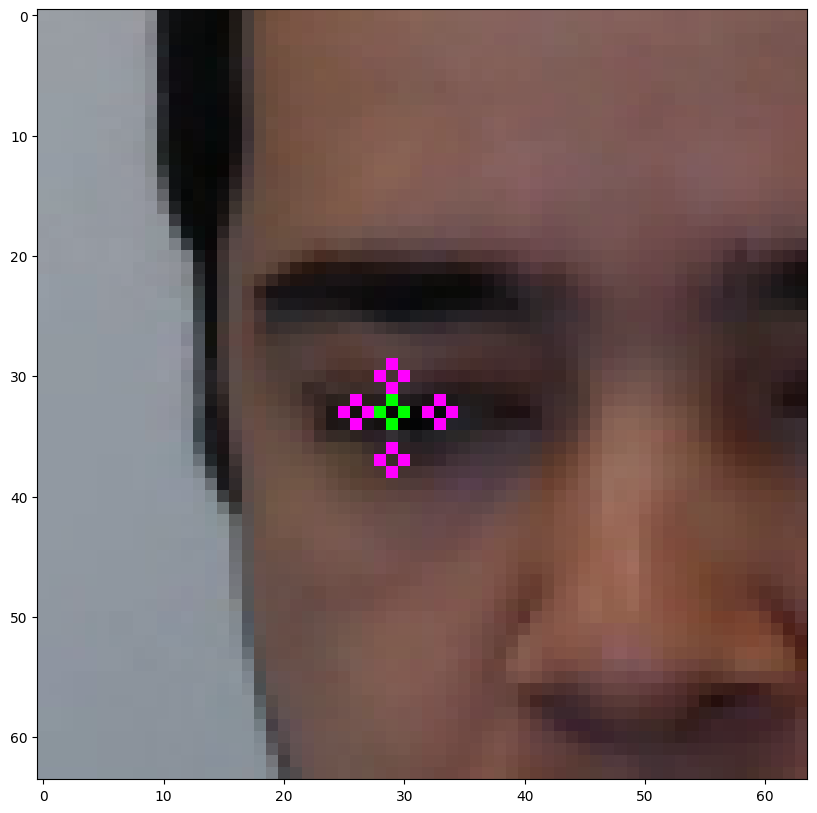

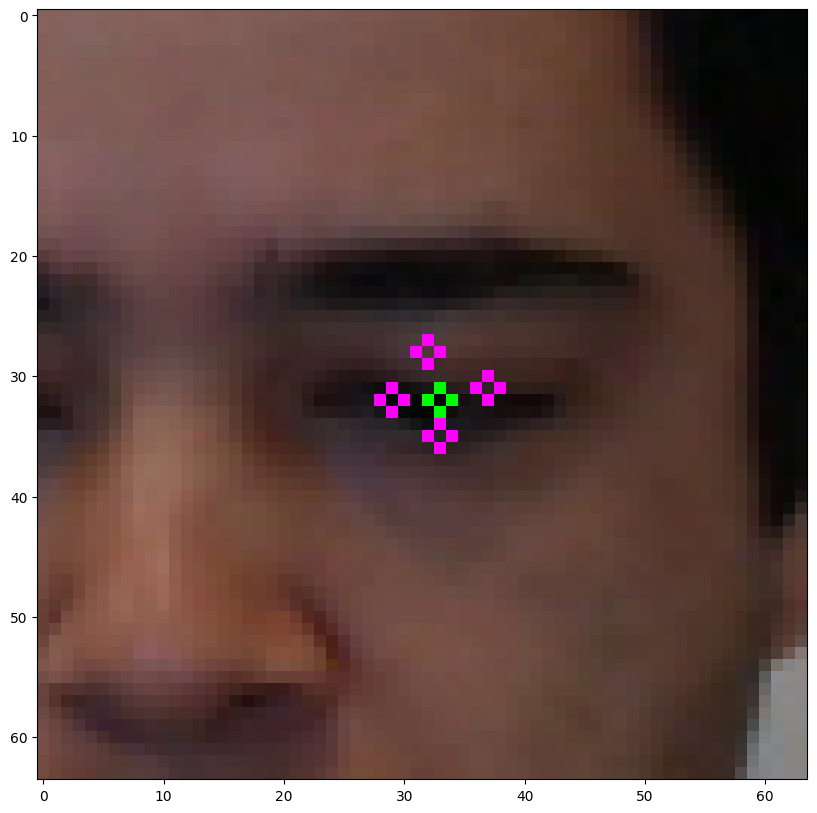

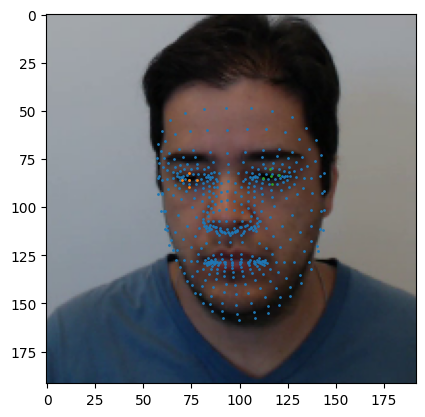

  1%|▊                                                                                                                       | 8/1227 [00:06<16:02,  1.27it/s]

/home/newuser/data/0_new_data/P_51/1493057462712_26_-study-where_to_find_morel_mushrooms_writing/frame4926.png


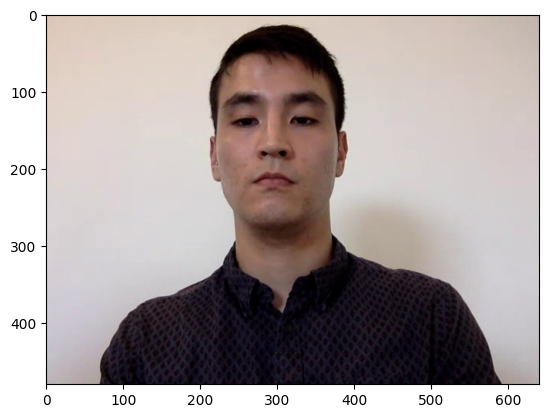

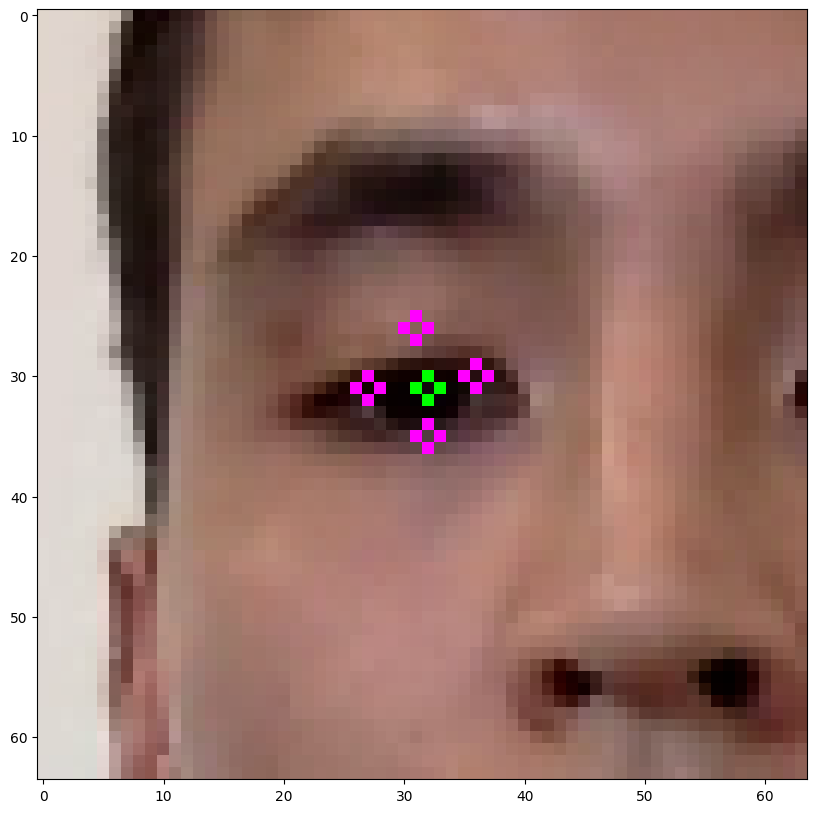

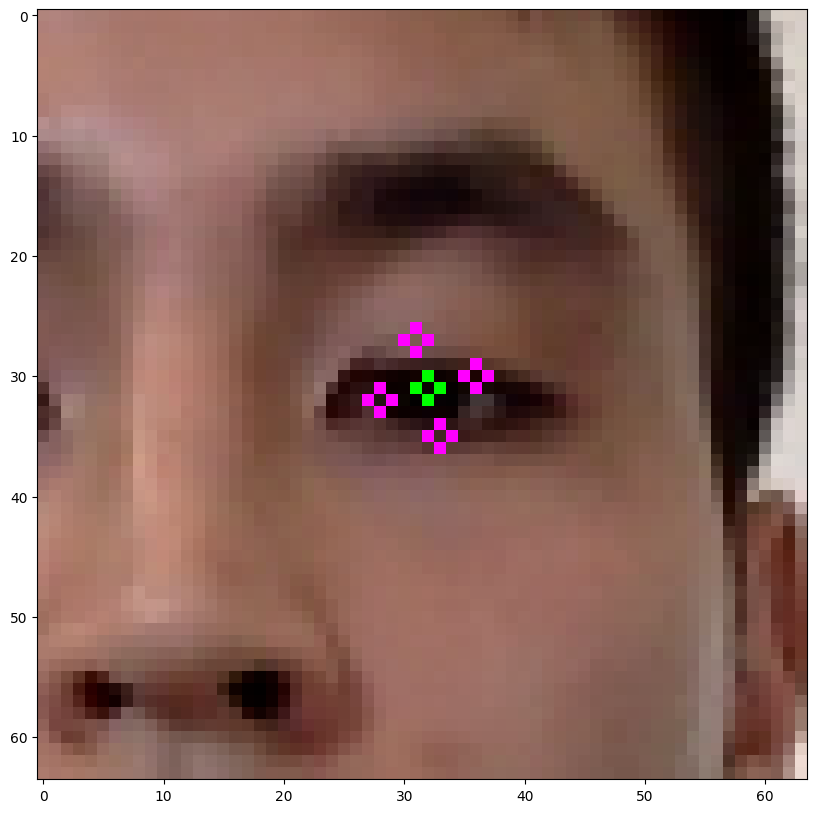

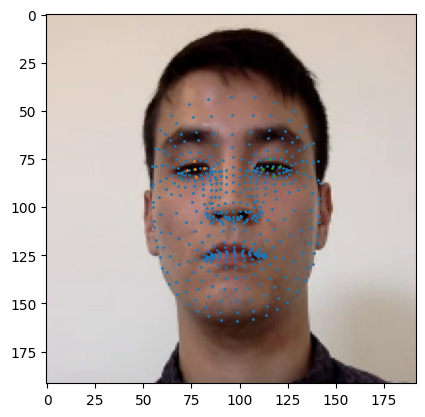

  1%|▉                                                                                                                       | 9/1227 [00:07<15:56,  1.27it/s]

/home/newuser/data/0_new_data/P_46/1492780566148_10_-study-benefits_of_running_writing/frame5611.png


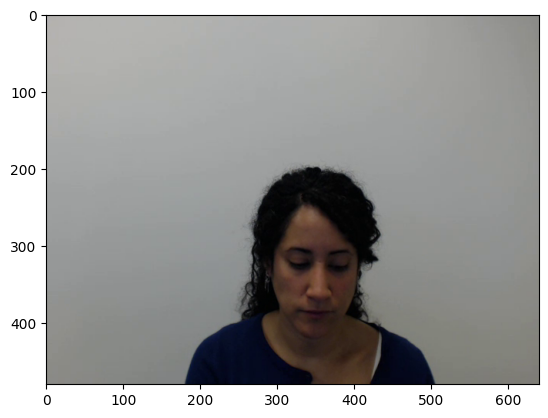

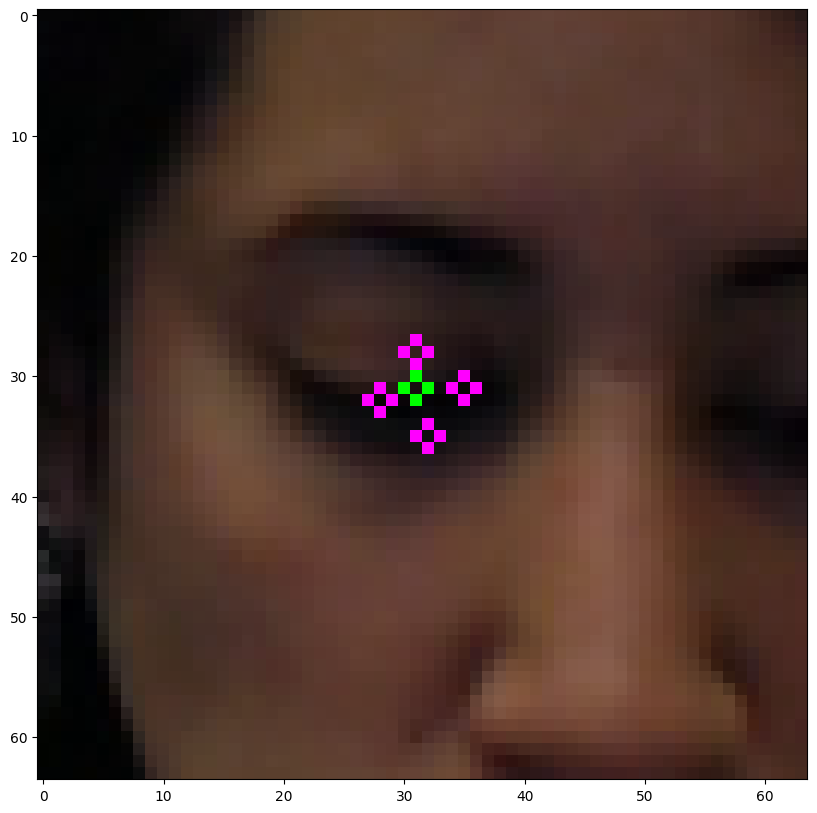

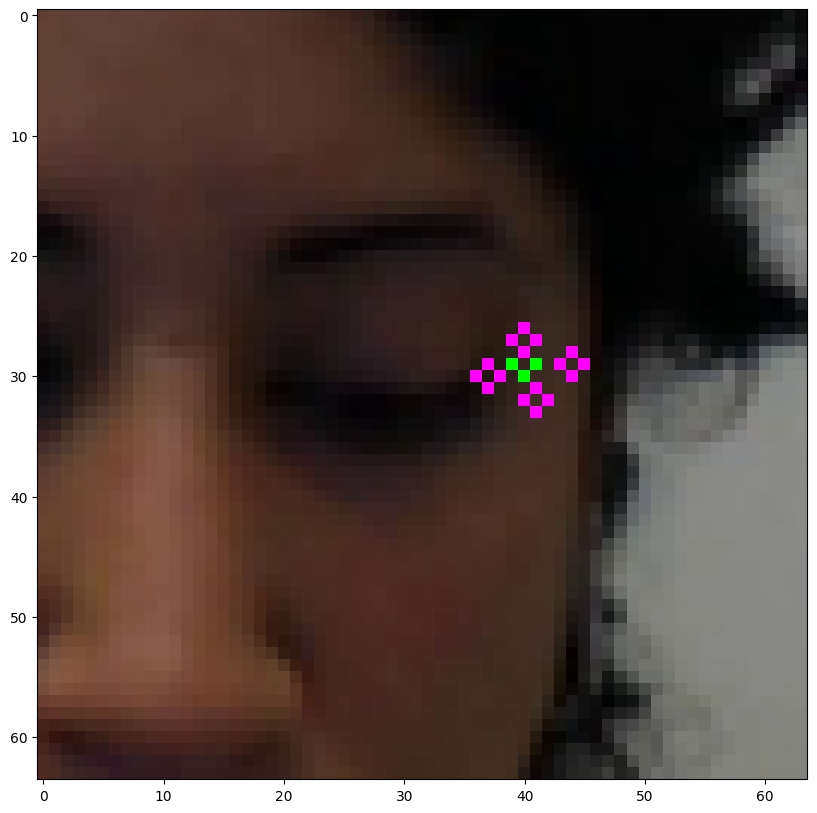

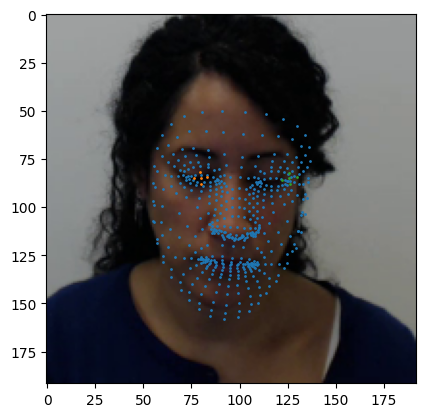

  1%|▉                                                                                                                      | 10/1227 [00:07<15:44,  1.29it/s]

/home/newuser/data/0_new_data/P_17/1491942071066_9_-study-benefits_of_running_writing/frame2827.png


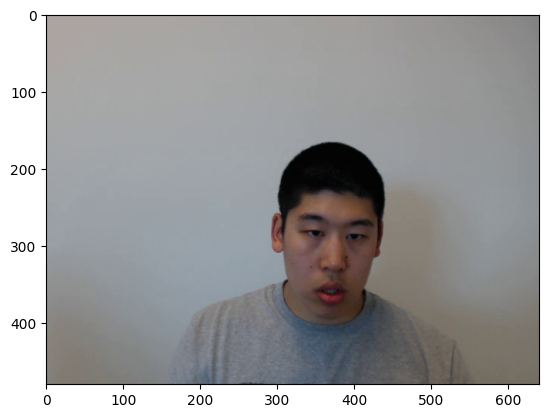

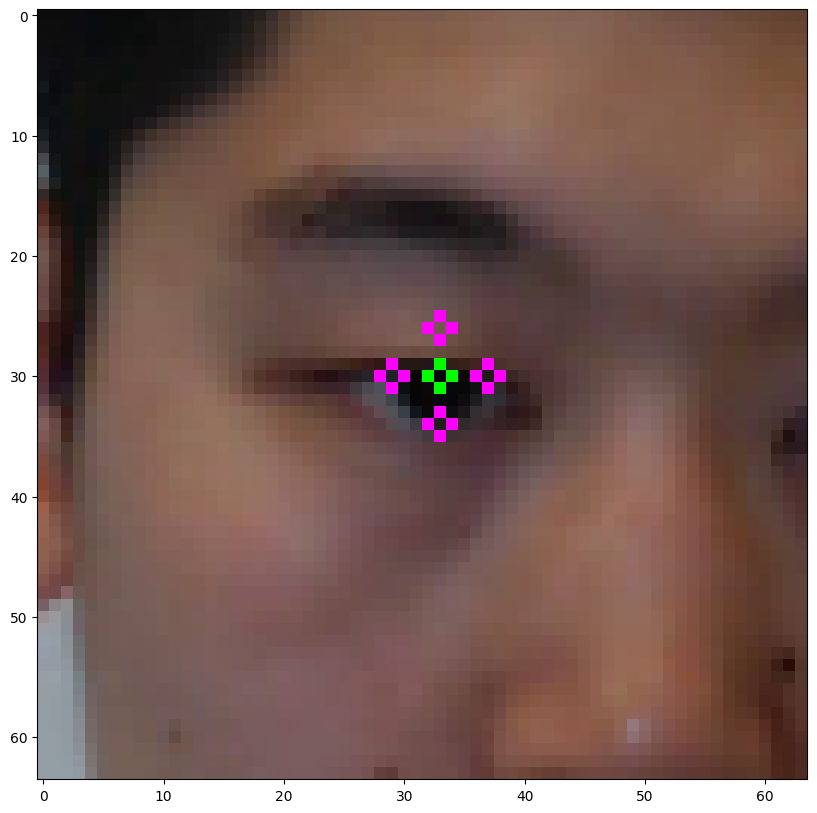

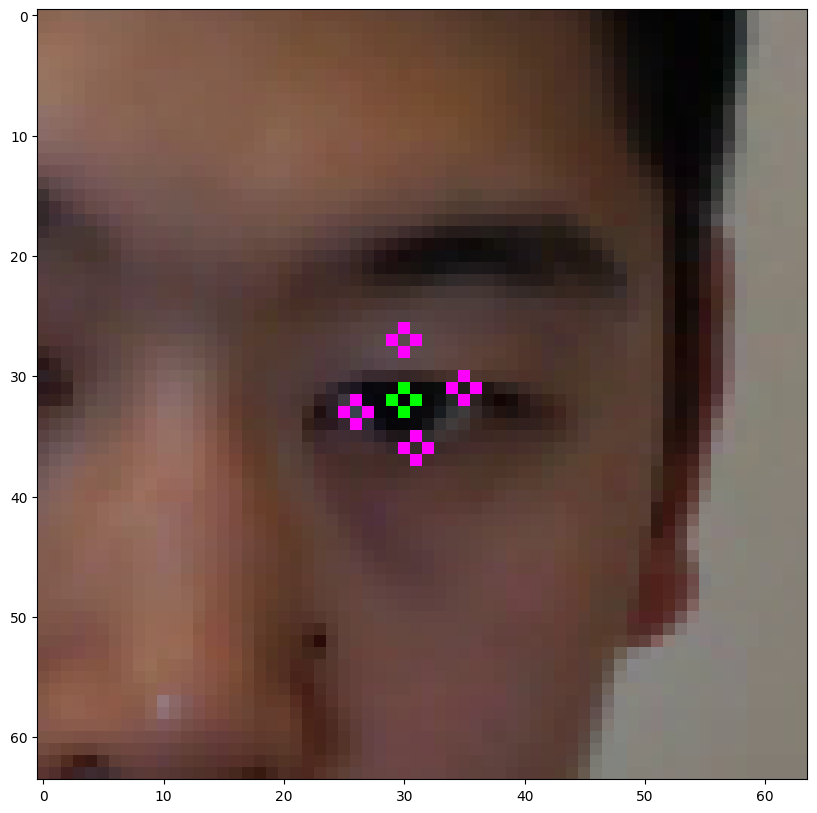

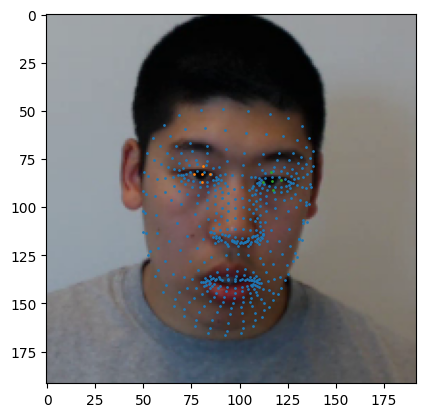

  1%|█                                                                                                                      | 11/1227 [00:08<15:42,  1.29it/s]

/home/newuser/data/0_new_data/P_23/1492097686620_4_-study-dot_test/frame334.png


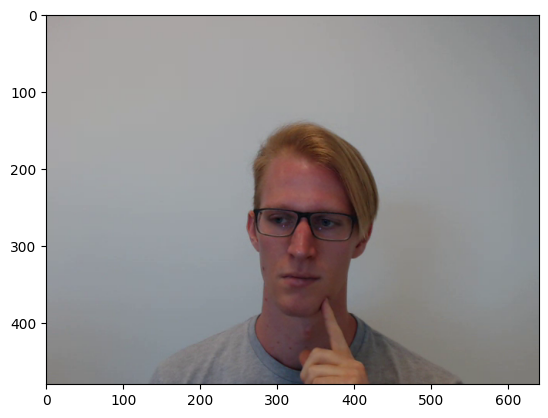

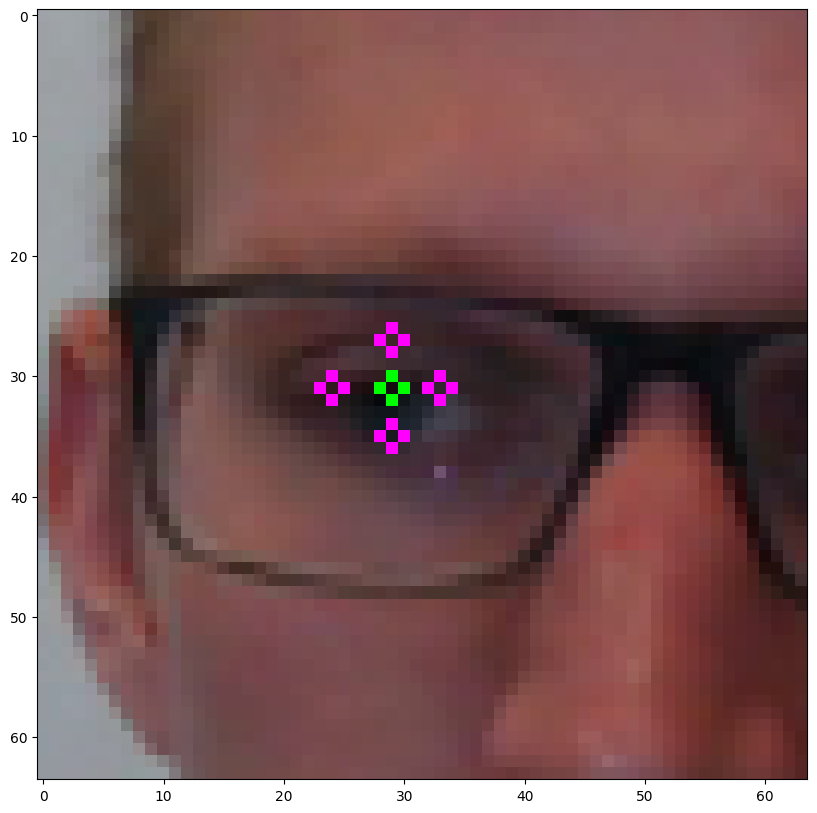

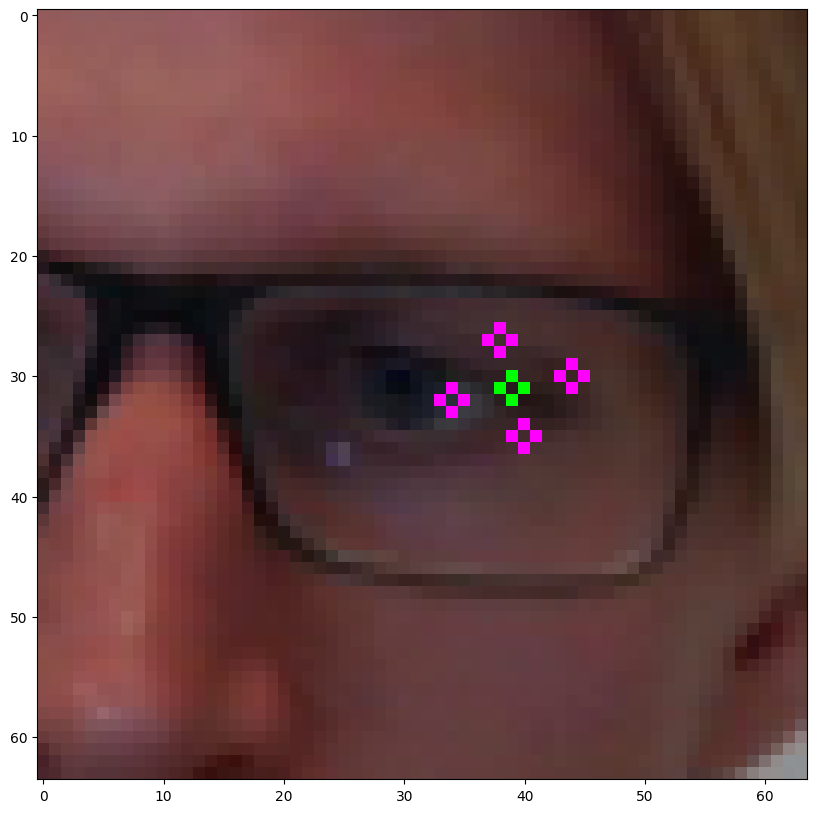

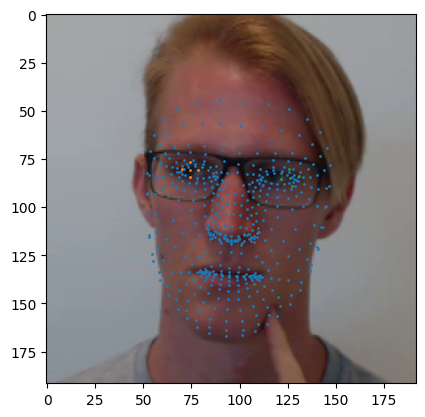

  1%|█▏                                                                                                                     | 12/1227 [00:09<15:39,  1.29it/s]

/home/newuser/data/0_new_data/P_41/1492697240587_3_-study-dot_test/frame279.png


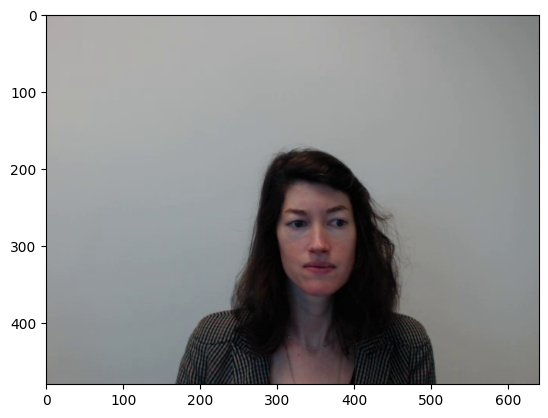

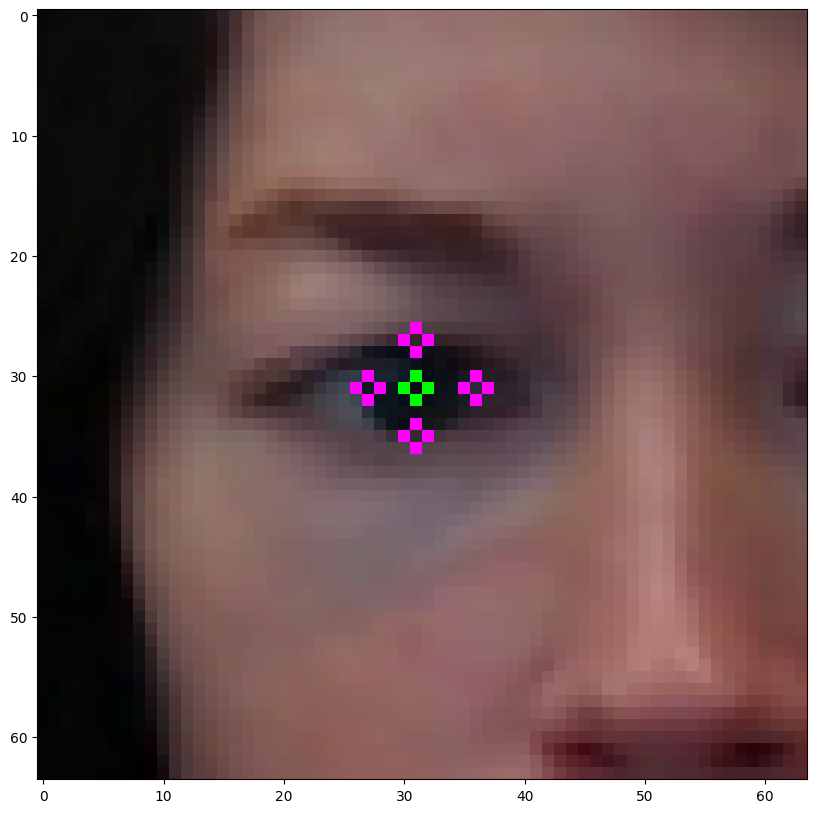

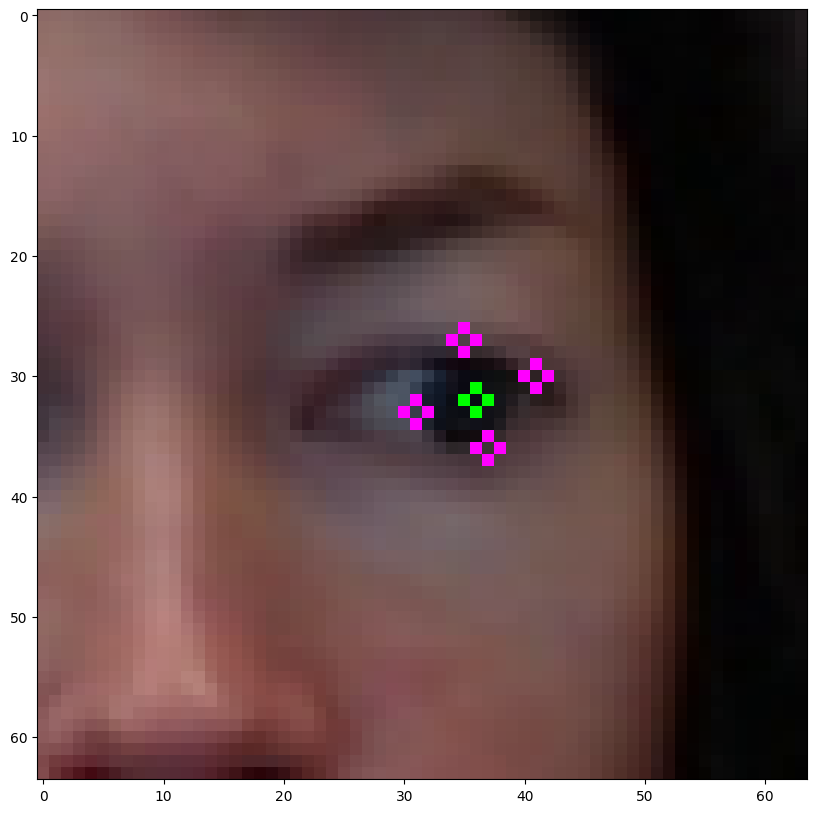

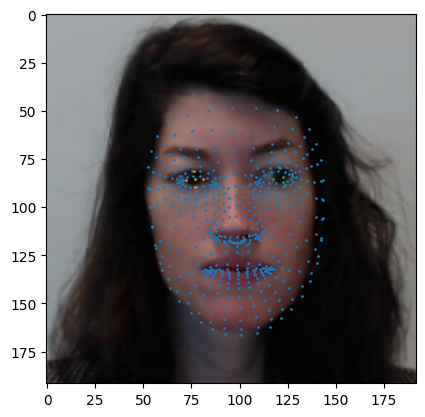

  1%|█▎                                                                                                                     | 13/1227 [00:10<16:25,  1.23it/s]

/home/newuser/data/0_new_data/P_20/1492020948838_3_-study-dot_test/frame538.png


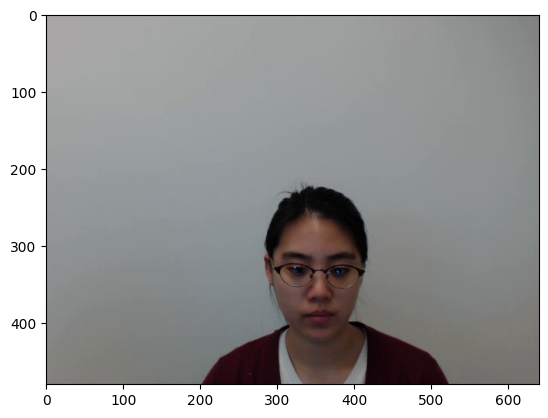

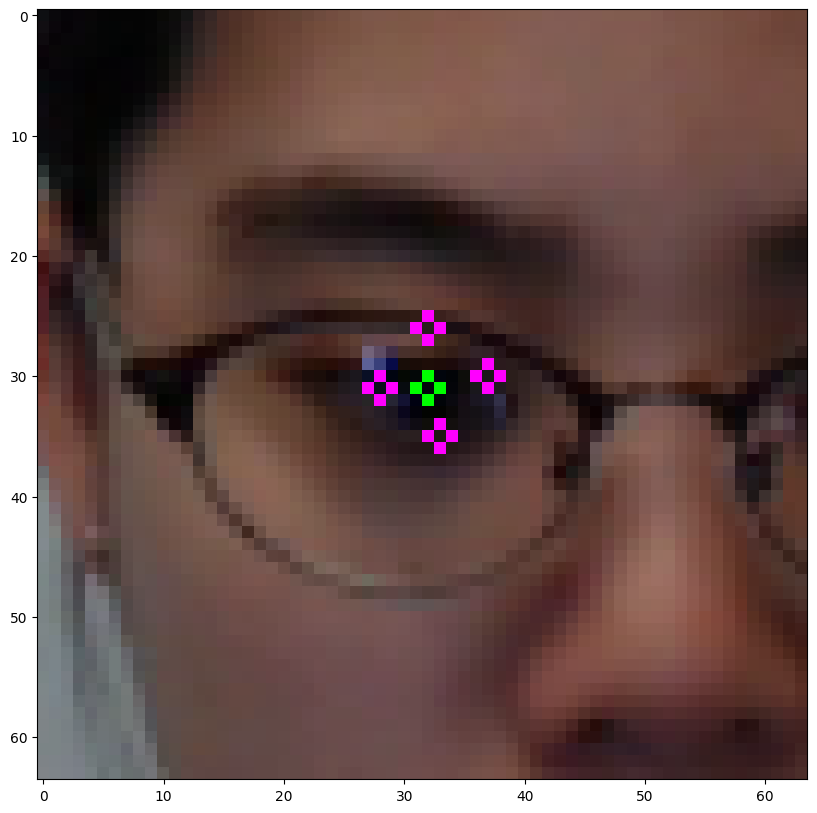

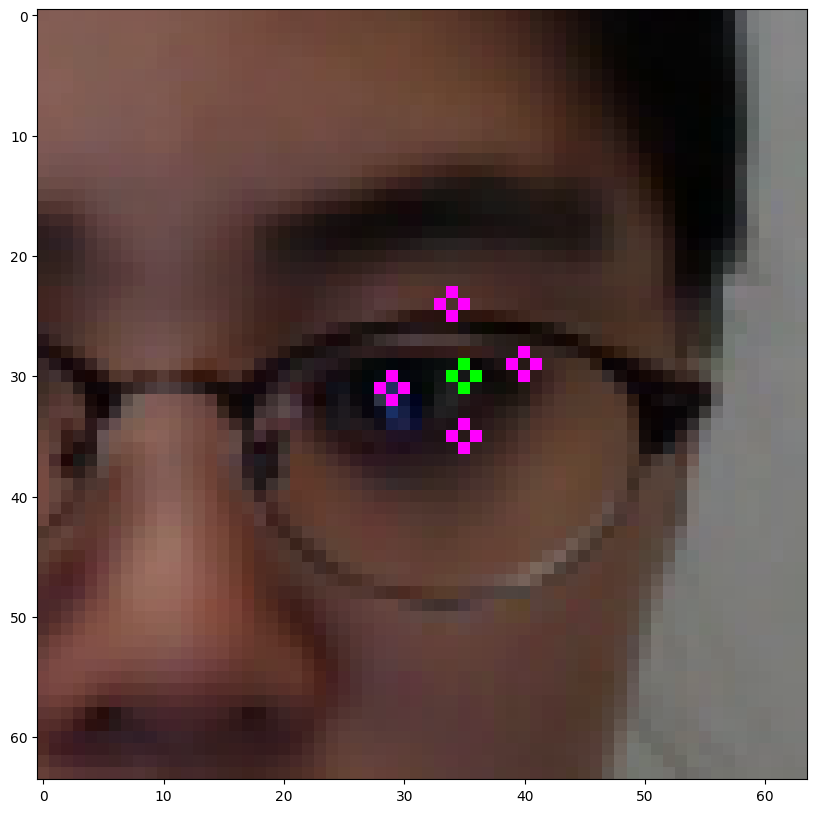

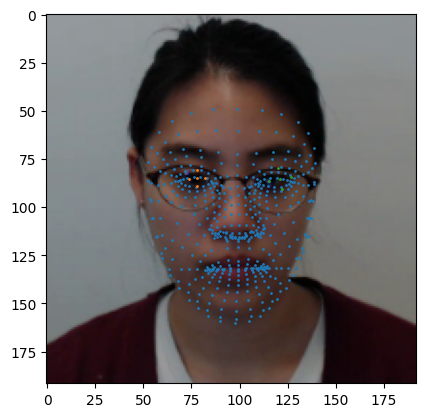

  1%|█▎                                                                                                                     | 14/1227 [00:11<16:02,  1.26it/s]

/home/newuser/data/0_new_data/P_41/1492697240587_3_-study-dot_test/frame369.png


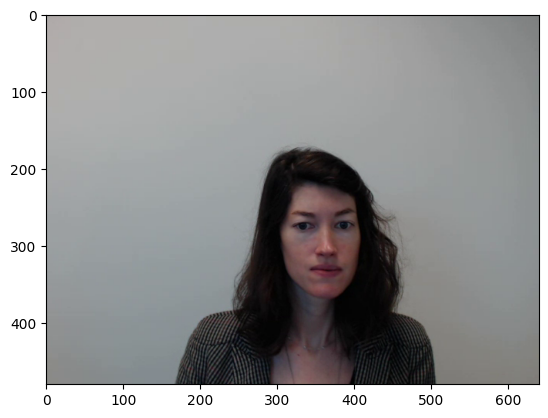

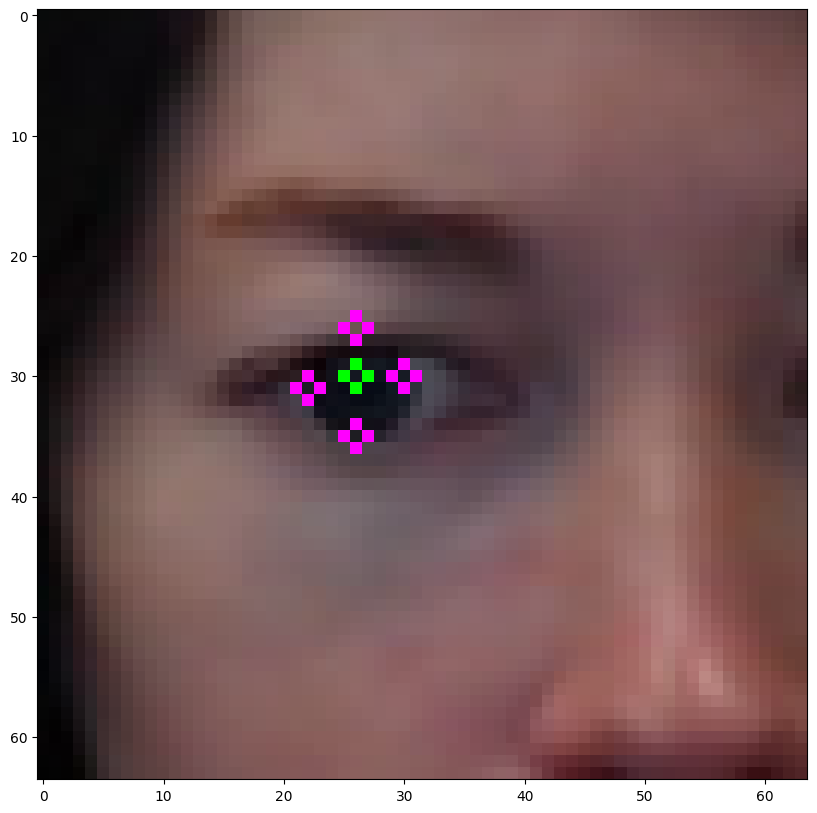

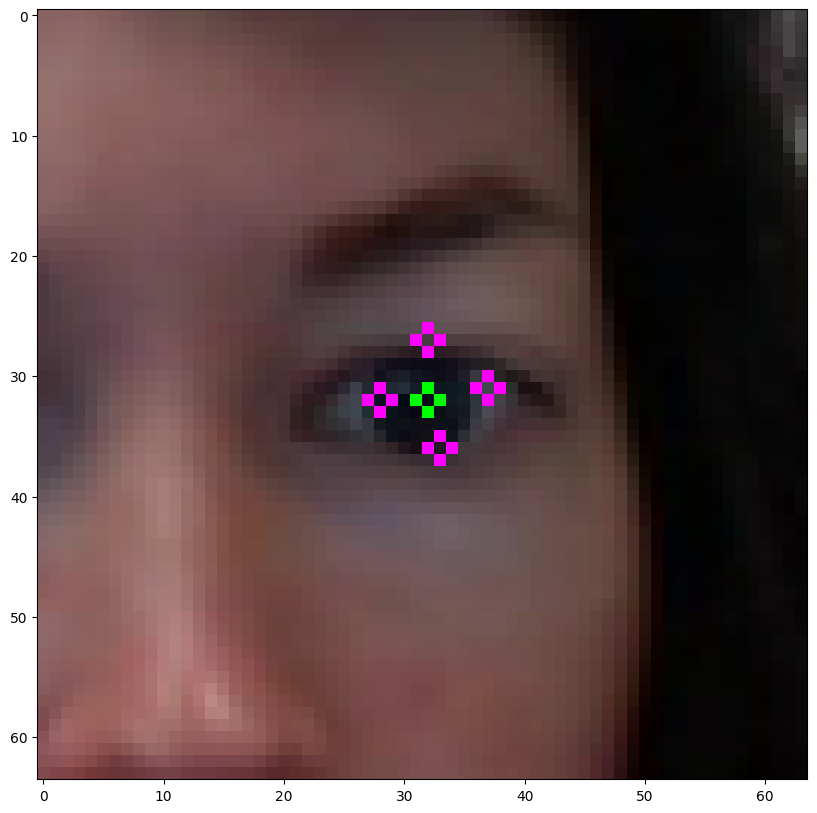

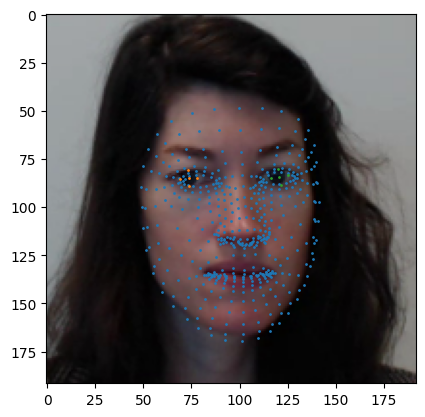

  1%|█▍                                                                                                                     | 15/1227 [00:11<15:49,  1.28it/s]

/home/newuser/data/0_new_data/P_46/1492780566148_21_-study-tooth_abscess_writing/frame23.png


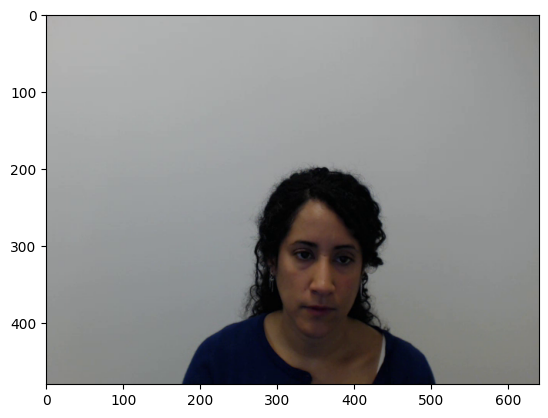

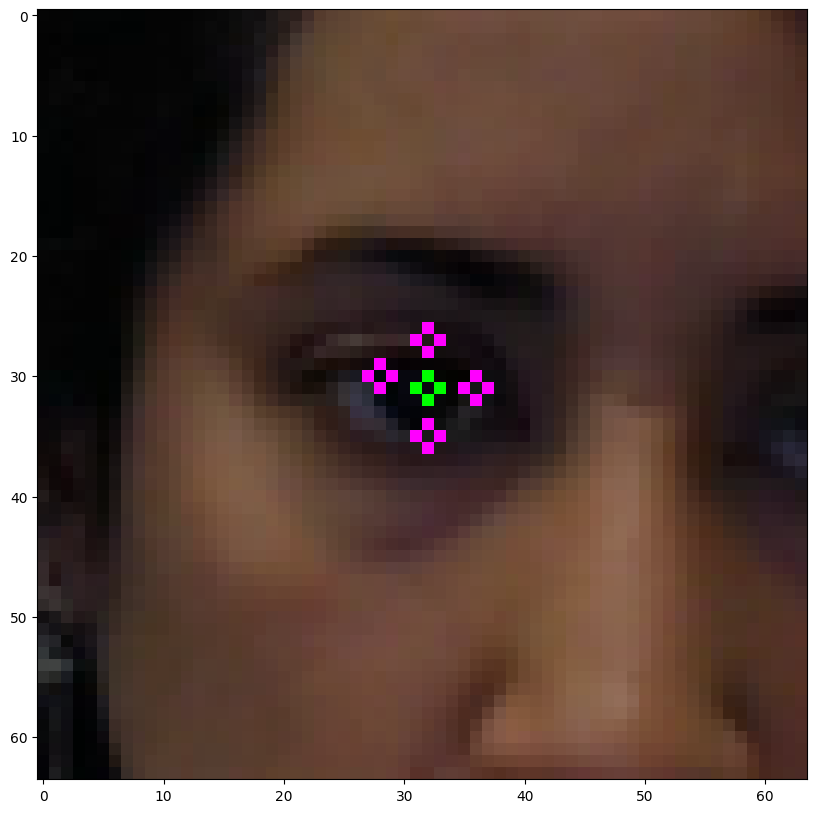

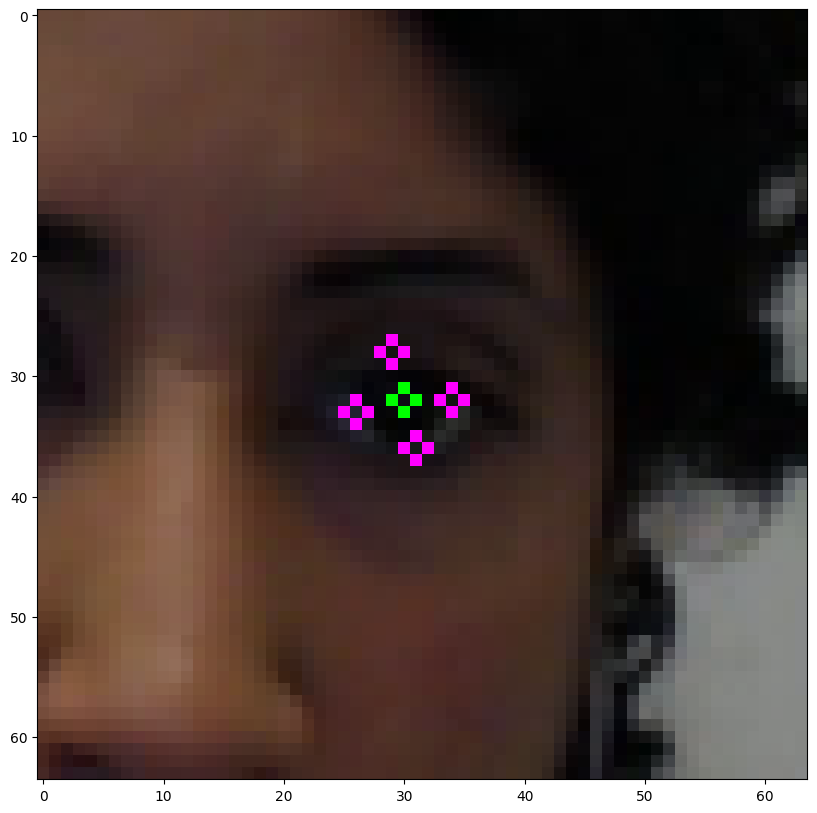

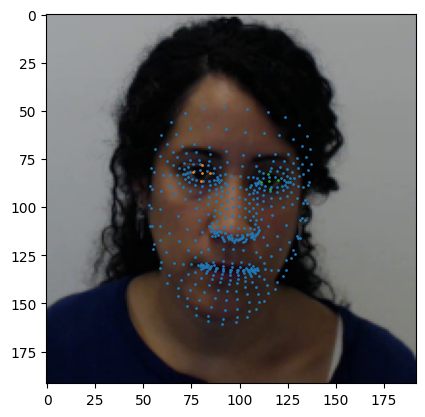

  1%|█▌                                                                                                                     | 16/1227 [00:12<15:43,  1.28it/s]

/home/newuser/data/0_new_data/P_39/1492629177607_21_-study-educational_advantages_of_social_networking_sites_writing/frame9200.png


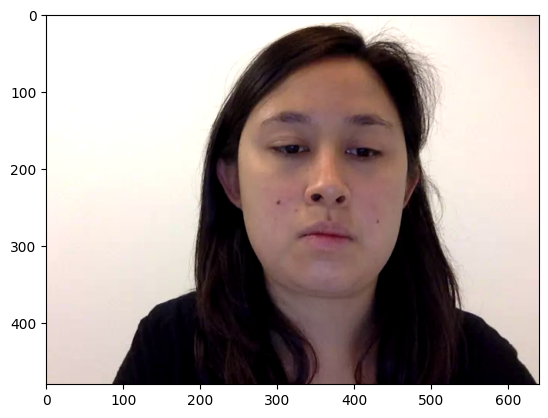

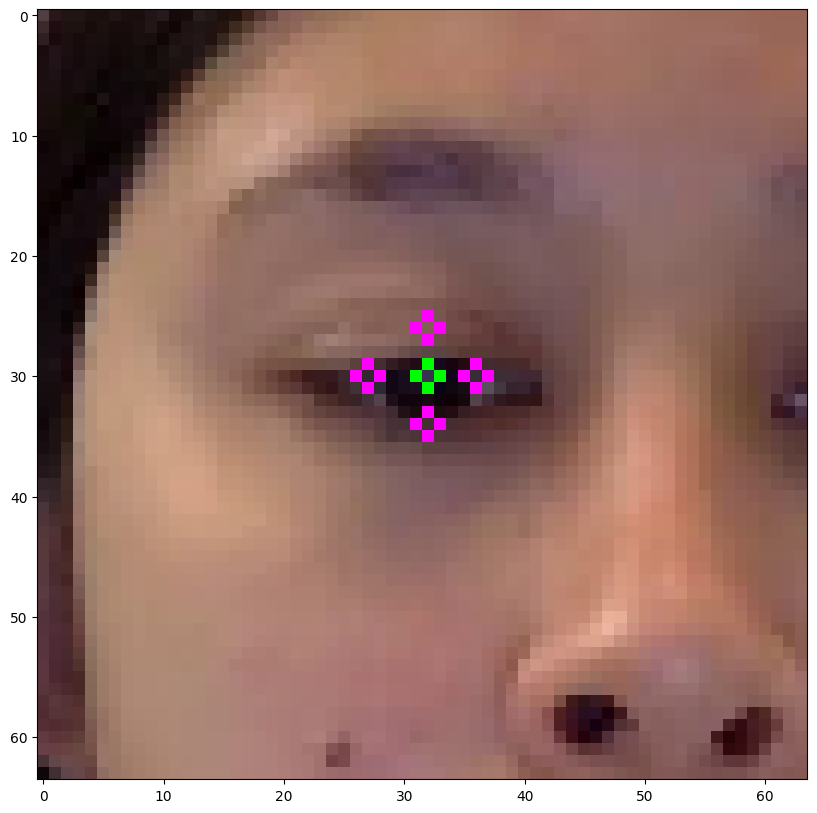

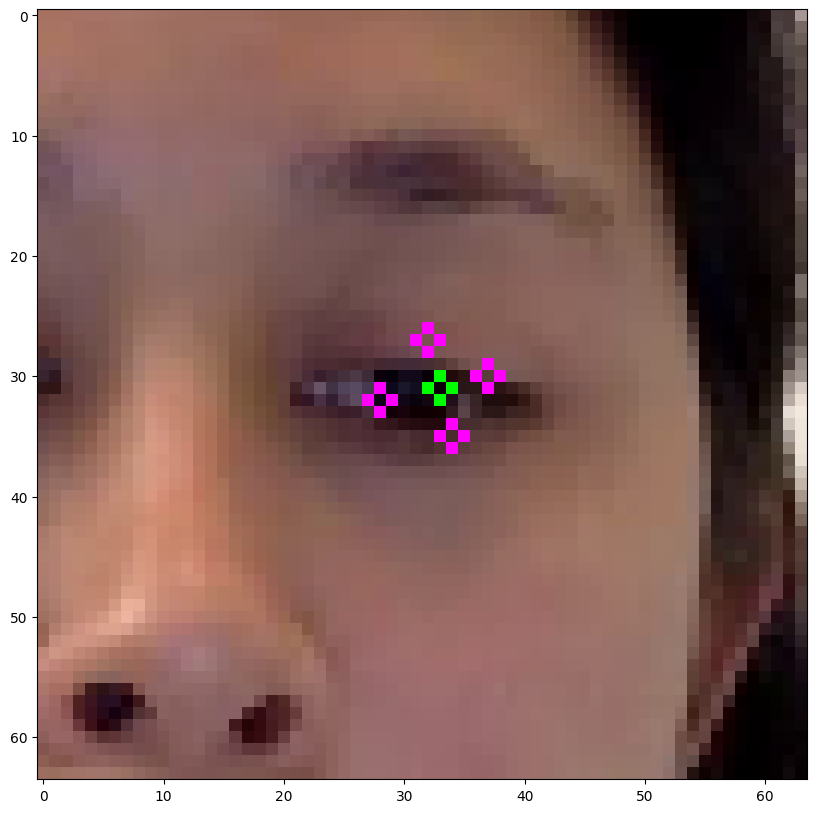

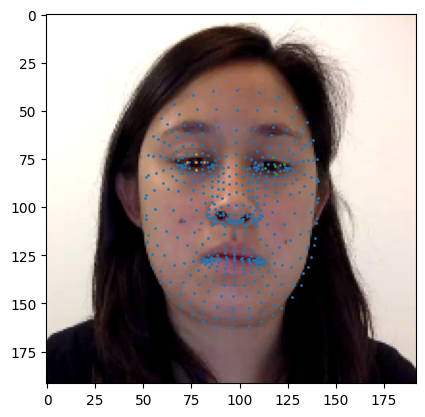

  1%|█▋                                                                                                                     | 17/1227 [00:13<15:41,  1.29it/s]

/home/newuser/data/0_new_data/P_15/1491933738937_12_-study-benefits_of_running_writing/frame1750.png


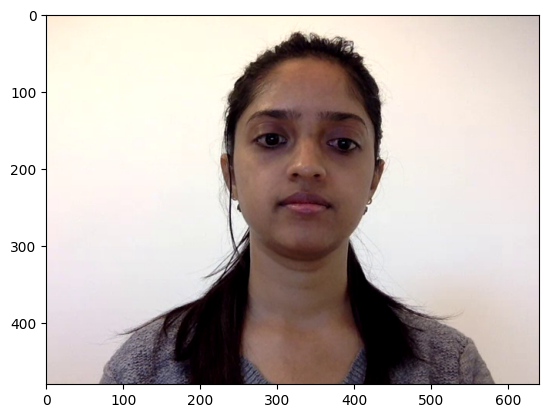

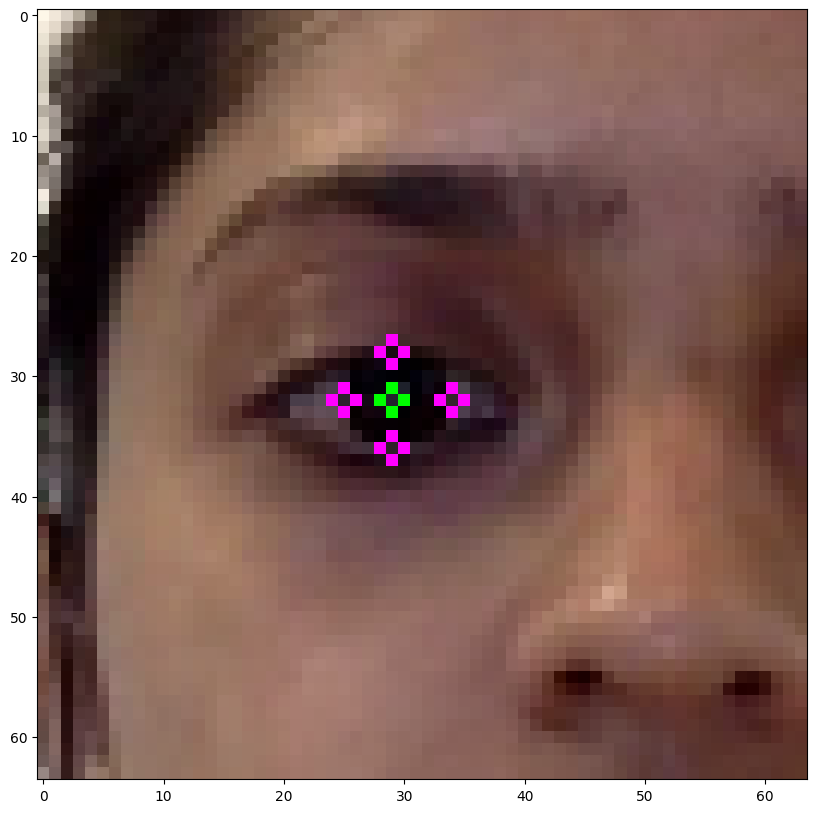

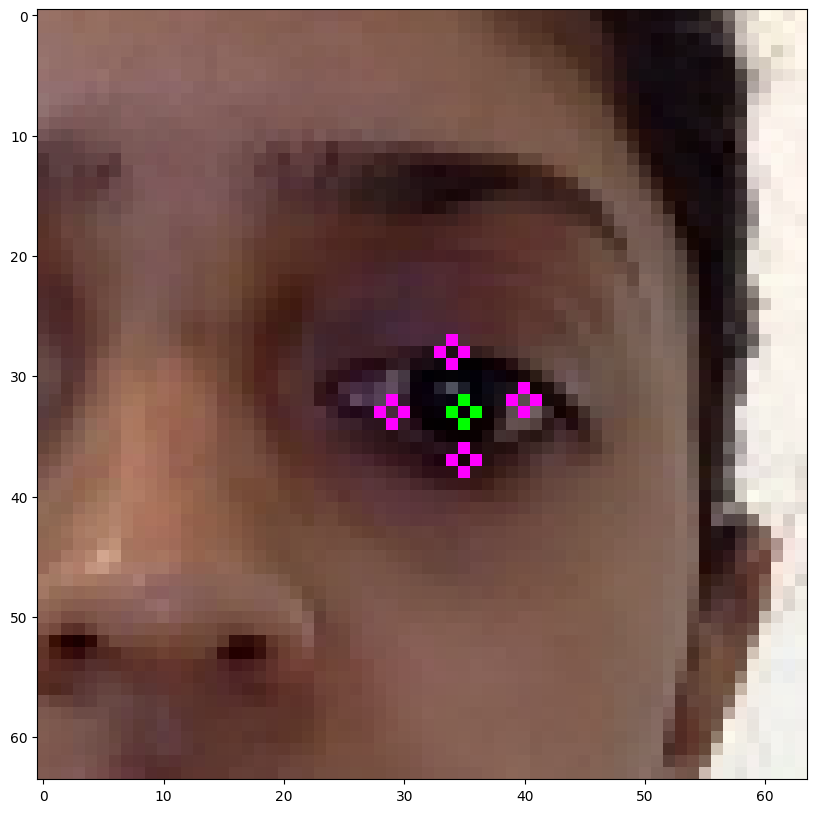

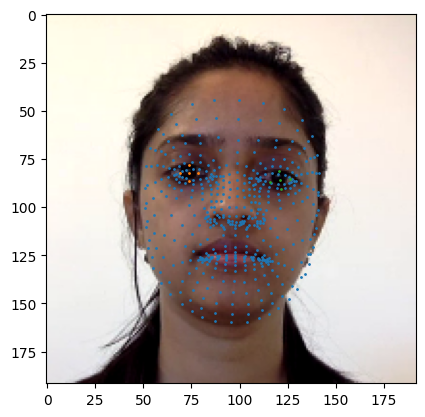

  1%|█▋                                                                                                                     | 18/1227 [00:14<15:39,  1.29it/s]

/home/newuser/data/0_new_data/P_02/1491487691210_25_-study-tooth_abscess_writing/frame44.png


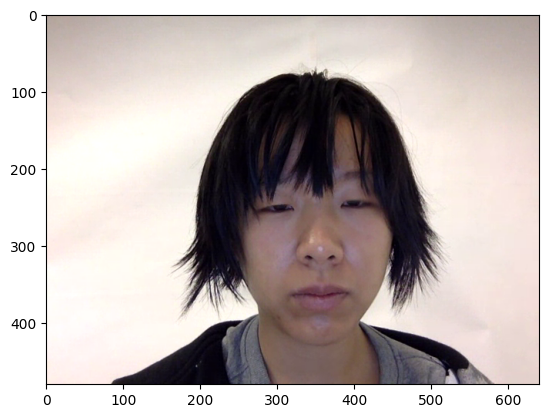

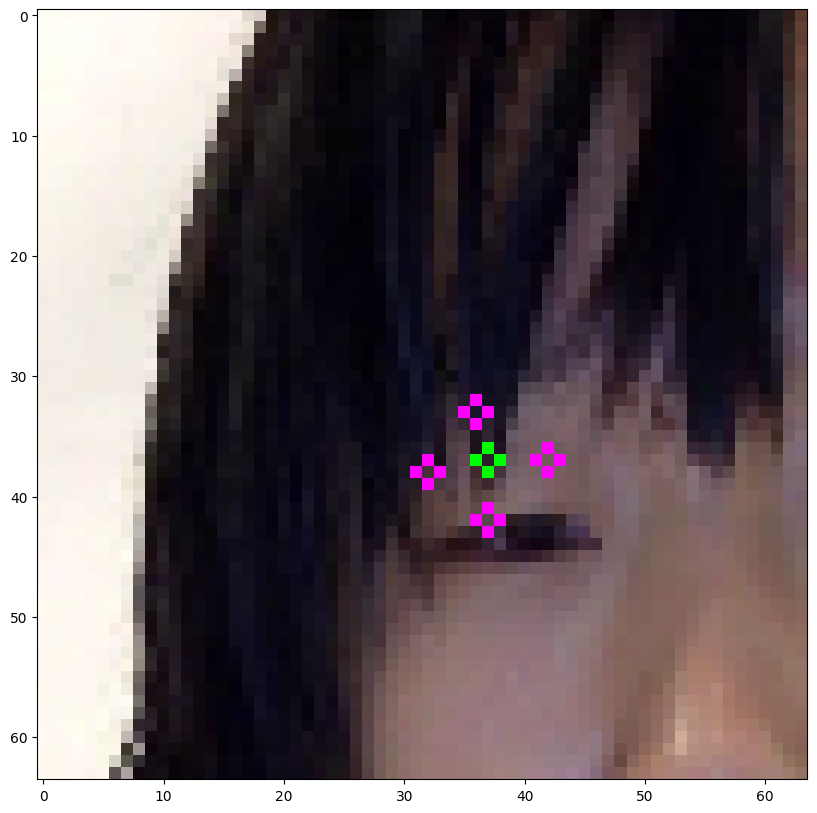

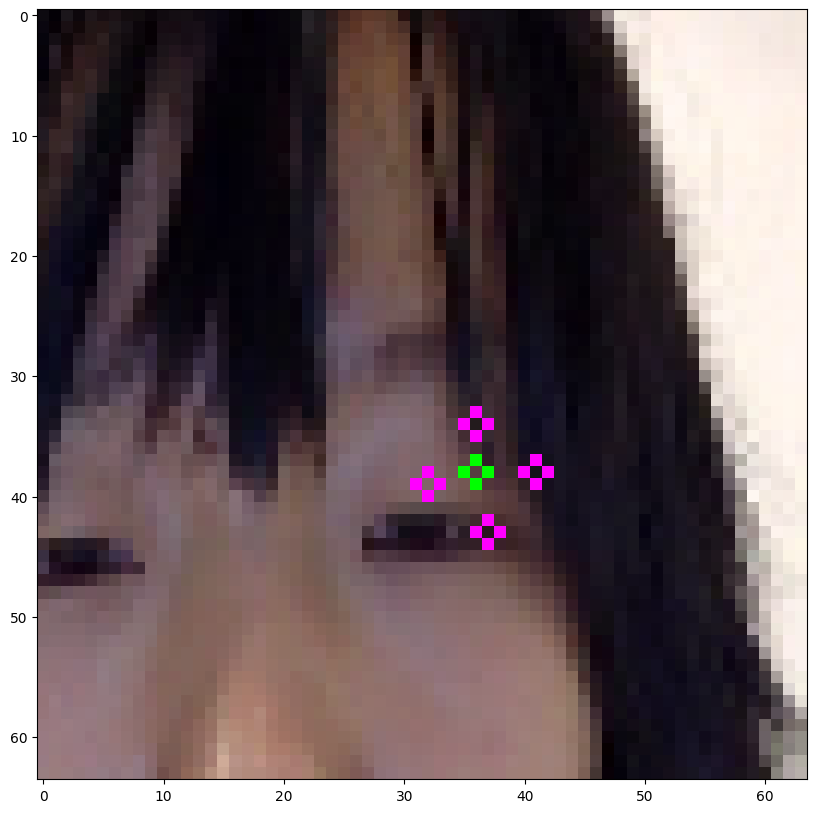

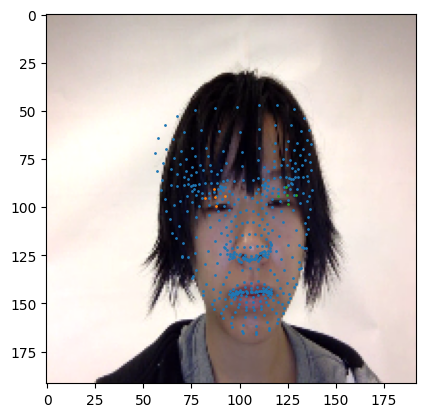

  2%|█▊                                                                                                                     | 19/1227 [00:15<15:59,  1.26it/s]

/home/newuser/data/0_new_data/P_01/1491423217564_14_-study-benefits_of_running_instructions/frame358.png


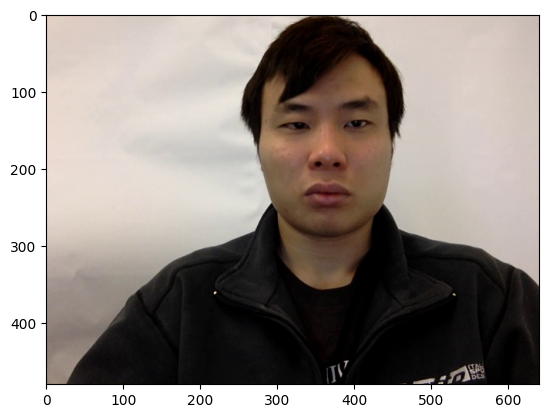

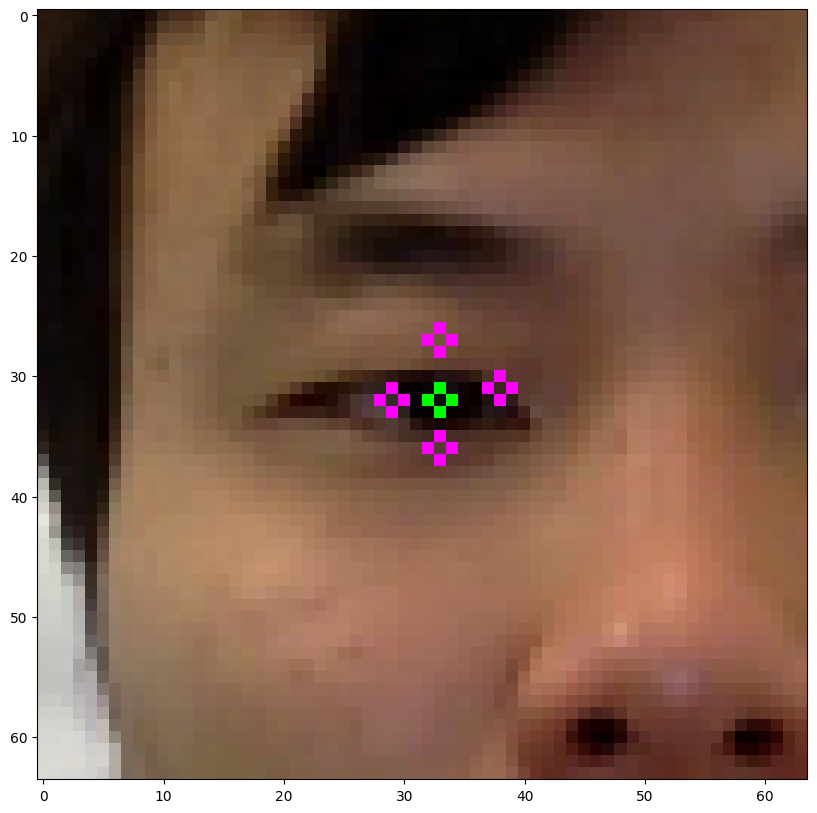

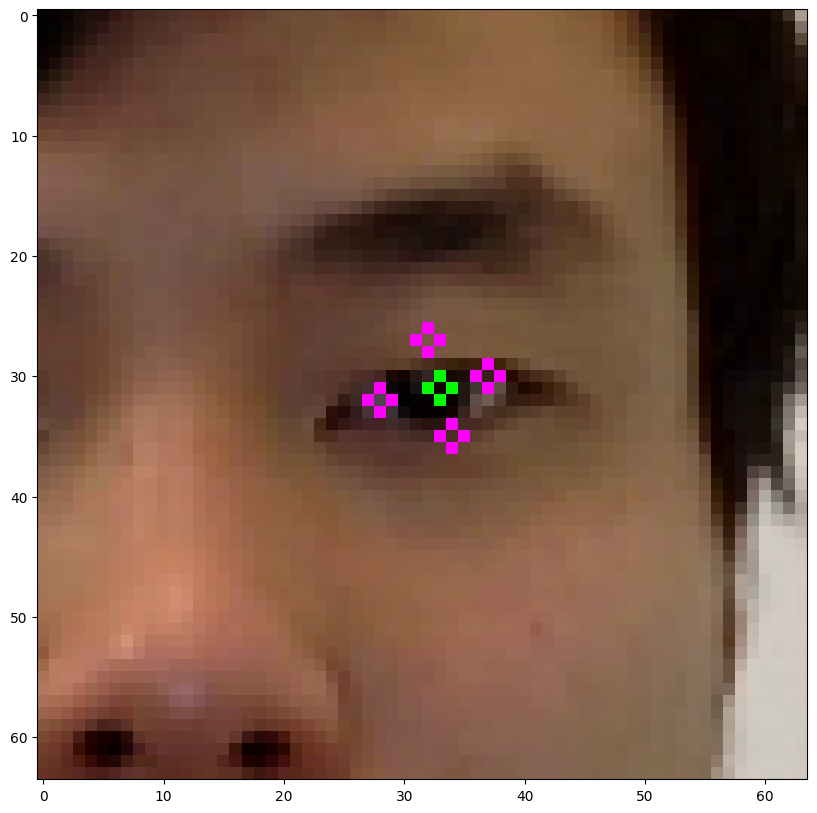

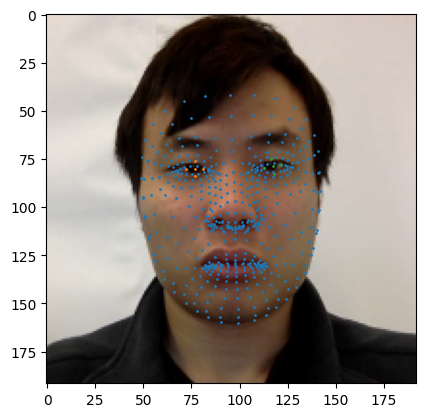

  2%|█▉                                                                                                                     | 20/1227 [00:15<16:00,  1.26it/s]

/home/newuser/data/0_new_data/P_38/1492618354027_10_-study-benefits_of_running_writing/frame3602.png


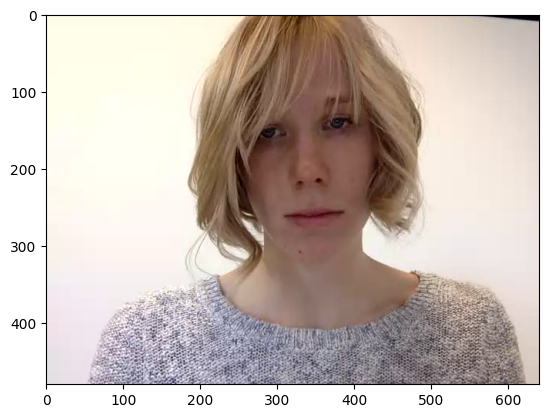

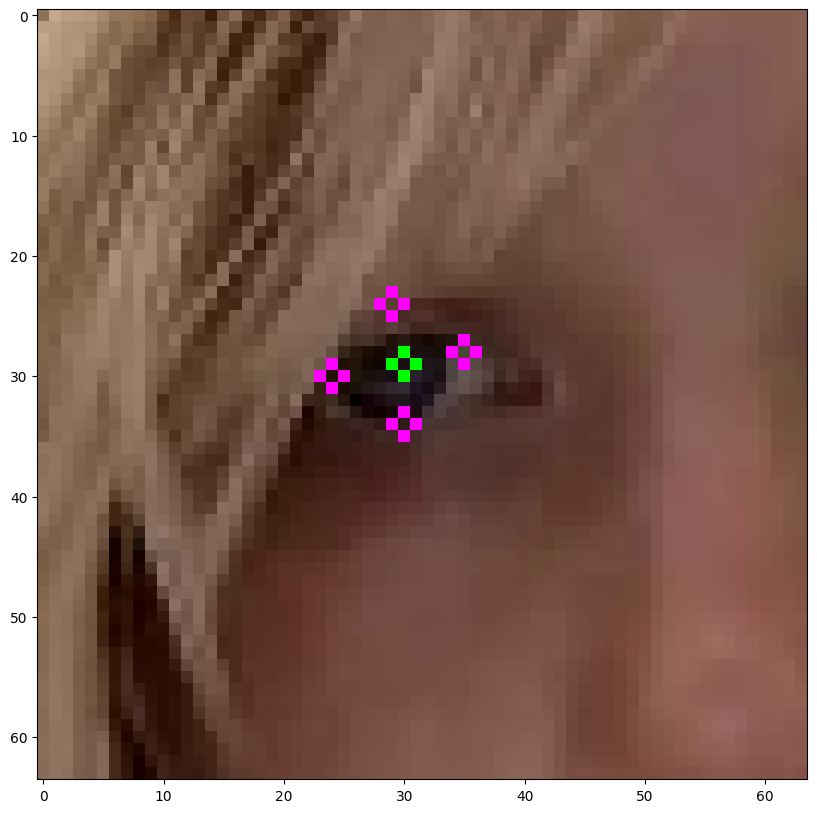

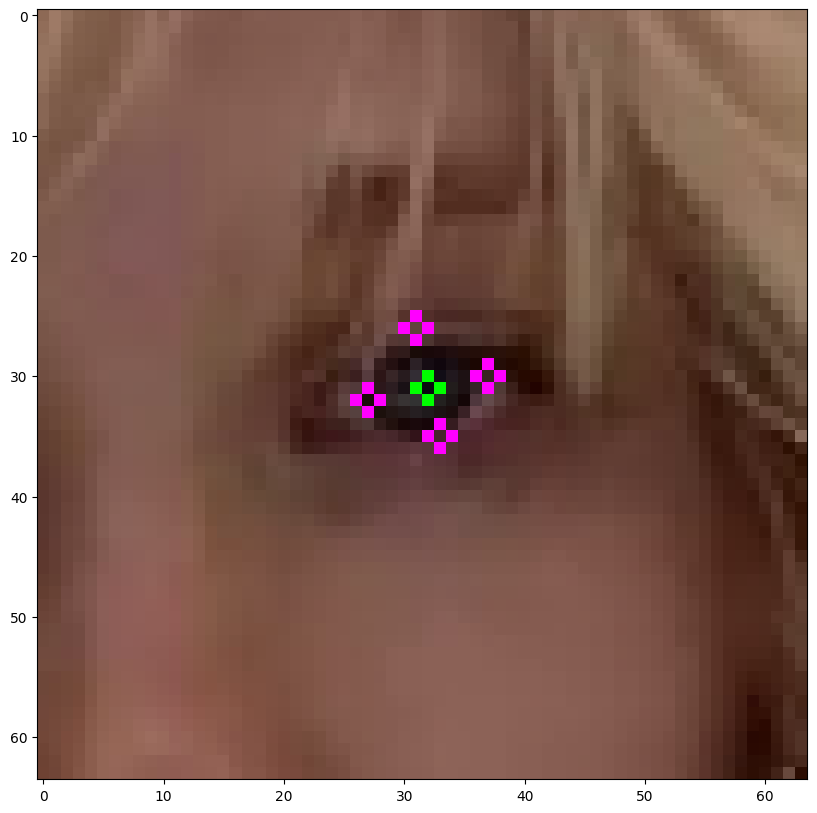

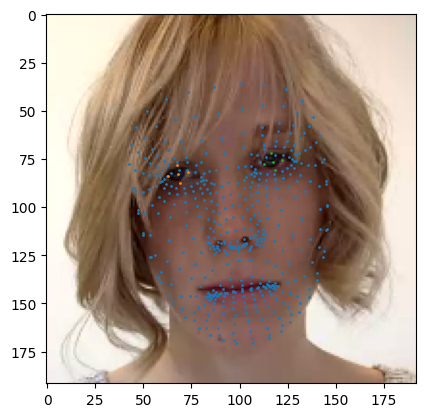

  2%|██                                                                                                                     | 21/1227 [00:16<15:55,  1.26it/s]

/home/newuser/data/0_new_data/P_50/1493046335268_3_-study-dot_test/frame108.png


In [11]:
i = 0
for path in tqdm(np.random.permutation(image_paths)):
    print(path)
    if i > 20:
        break
    _, _,_ = feature_extractor.extract_features(path, plot = True)
    i += 1

In [12]:
features_dict = {}
no_face_list = []
num_faces_list = []
for path in tqdm(image_paths):
    features_dict[path], no_face_path, num_faces = feature_extractor.extract_features(path)
    no_face_list += no_face_path
    num_faces_list.append(num_faces)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1227/1227 [01:07<00:00, 18.16it/s]


In [13]:
import json

with open("../data/clicks_features.json", "w") as f:
    json.dump(features_dict, f)

In [14]:
no_face_list

['/home/newuser/data/0_new_data/P_40/1492693878775_3_-study-dot_test/frame242.png',
 '/home/newuser/data/0_new_data/P_59/1493215711300_9_-study-benefits_of_running_writing/frame538.png',
 '/home/newuser/data/0_new_data/P_59/1493215711300_9_-study-benefits_of_running_writing/frame2509.png',
 '/home/newuser/data/0_new_data/P_59/1493215711300_9_-study-benefits_of_running_writing/frame2522.png',
 '/home/newuser/data/0_new_data/P_59/1493215711300_9_-study-benefits_of_running_writing/frame2772.png',
 '/home/newuser/data/0_new_data/P_59/1493215711300_9_-study-benefits_of_running_writing/frame3256.png',
 '/home/newuser/data/0_new_data/P_59/1493215711300_9_-study-benefits_of_running_writing/frame3465.png',
 '/home/newuser/data/0_new_data/P_59/1493215711300_9_-study-benefits_of_running_writing/frame4424.png',
 '/home/newuser/data/0_new_data/P_59/1493215711300_12_-study-educational_advantages_of_social_networking_sites_writing/frame1510.png',
 '/home/newuser/data/0_new_data/P_59/1493215711300_12_

In [15]:
with open("../data/no_face_list.npy", "wb") as f:
    np.save(f, no_face_list)